In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam

# Import Data

In [2]:
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

In [3]:
data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Revisi%20Analisis/Data%20TMA%20(Jan%202022%20-%20Juni%202025).csv')
data = data.loc[:, ['Daily_Period','TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

print(data.head())
print(data.tail())
print(data.shape)

  Daily_Period  TMA_Daily
0   01/01/2022       10.0
1   02/01/2022       10.0
2   03/01/2022       10.0
3   04/01/2022       10.0
4   05/01/2022       12.5
     Daily_Period  TMA_Daily
1210   25/04/2025  20.000000
1211   26/04/2025  20.000000
1212   27/04/2025  20.000000
1213   28/04/2025  21.666667
1214   29/04/2025  20.000000
(1215, 2)


# Eksplorasi Data

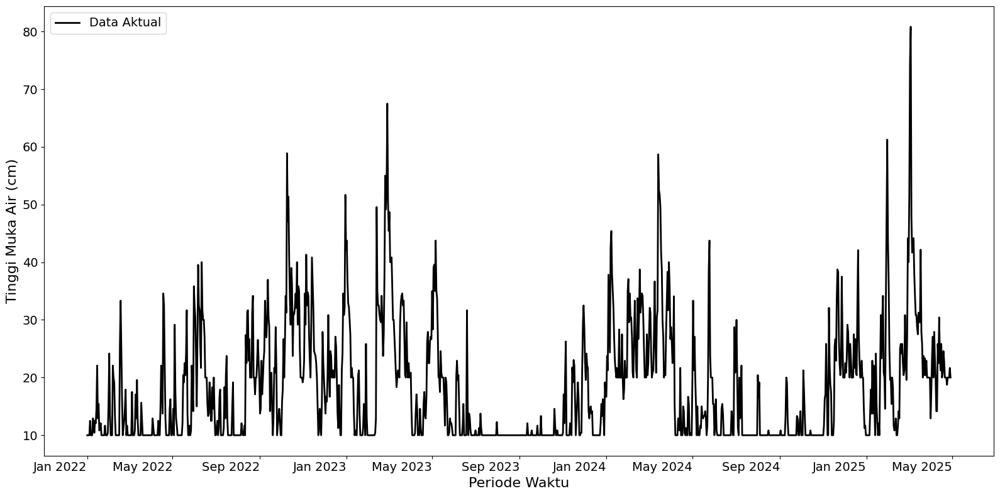

Dimension of full data: (1215, 2)


In [4]:
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, DateFormatter
import pandas as pd

# Pastikan kolom waktu dalam format datetime
data['Daily_Period'] = pd.to_datetime(data['Daily_Period'], format='%d/%m/%Y')

# Membuat plot seluruh data tanpa split
plt.figure(figsize=(16, 8))
plt.plot(data['Daily_Period'], data['TMA_Daily'], lw=2, color='black', label='Data Aktual')

# Label dan format
plt.xlabel('Periode Waktu', fontsize=16)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=16)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set axis locator dan format tanggal
plt.gca().xaxis.set_major_locator(MonthLocator(bymonth=[1, 5, 9]))
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))

# Format rotasi tanggal
plt.gcf().autofmt_xdate(rotation=0)

# Tambahkan legend
plt.legend(fontsize=14)
# plt.title('Plot Seluruh Data Time Series TMA', fontsize=18)

plt.tight_layout()
plt.show()

# Print dimensi total
print('Dimension of full data:', data.shape)

# Normalisasi Data

Proses normalisasi data dilakukan menggunakan metode min-max normalization hingga menghasilkan data yang berskala [0,1].

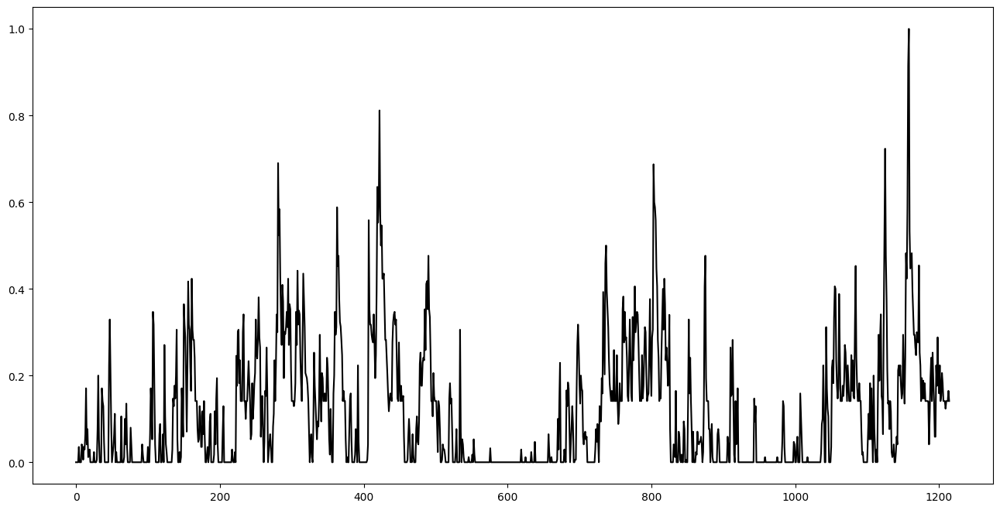

In [5]:
# Step 1: Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
data['TMA_normalized'] = scaler.fit_transform(data['TMA_Daily'].values.reshape(-1, 1))
plt.figure(figsize=(16, 8))
plt.plot(data['TMA_normalized'], color='black')

In [6]:
print(data['TMA_normalized'].head())
print(data['TMA_normalized'].tail())

0    0.000000
1    0.000000
2    0.000000
3    0.000000
4    0.035294
Name: TMA_normalized, dtype: float64
1210    0.141176
1211    0.141176
1212    0.141176
1213    0.164706
1214    0.141176
Name: TMA_normalized, dtype: float64


# Hyperparameter Tuning & Cross Validation

Hyperparameter tuning dilakukan untuk menentukan hyperparameter terbaik melalui langkah validasi berupa *time series k-fold cross validation*. Banyaknya fold yang digunakan dalam langkah validasi adalah sebanyak k = 5 fold.

In [7]:
data_series = data['TMA_normalized'].values
data_series = data_series.reshape((len(data_series), 1))
data_series

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.14117647],
       [0.16470588],
       [0.14117647]])

In [8]:
from tensorflow.keras.initializers import HeUniform, GlorotUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Pilih initializer berdasarkan parameter
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    elif init_scheme == 'glorot_uniform':
        initializer = GlorotUniform()
    else:
        raise ValueError("init_scheme harus 'he_uniform' atau 'glorot_uniform'")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(30, 1),
        return_sequences=True,
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(LSTM(
        16,
        activation='tanh',
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(Dropout(0.1))
    model.add(Dense(1, kernel_initializer=initializer, bias_initializer='zeros'))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [9]:
import keras

class EarlyStoppingAtMinLoss(keras.callbacks.Callback):
    """Stop training when the loss is at its min, i.e. the loss stops decreasing.

    Arguments:
        patience: Number of epochs to wait after min has been hit. After this
        number of no improvement, training stops.
    """

    def __init__(self, patience=0):
        super().__init__()
        self.patience = patience
        # best_weights to store the weights at which the minimum loss occurs.
        self.best_weights = None

    def on_train_begin(self, logs=None):
        # The number of epoch it has waited when loss is no longer minimum.
        self.wait = 0
        # The epoch the training stops at.
        self.stopped_epoch = 0
        # Initialize the best as infinity.
        self.best = np.inf

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get("val_loss")
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            # print('abcd')
            # Record the best weights if current results is better (less).
            self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                print("Restoring model weights from the end of the best epoch.")
                self.model.set_weights(self.best_weights)

    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print("Epoch %05d: early stopping" % (self.stopped_epoch + 1))

## Sliding Window Cross Validation

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0909 - val_loss: 0.0294
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0102 - val_loss: 0.0461
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0105 - val_loss: 0.0228
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0104 - val_loss: 0.0337
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0079 - val_loss: 0.0205
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0065 - val_loss: 0.0276
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0041 - val_loss: 0.0249
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0039 - val_loss: 0.0351
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0063 - val_loss: 0.0367
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0064Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0063 - val_loss: 0.0377
Epoch 00010: early stopping
30/30 ━━━━━━━

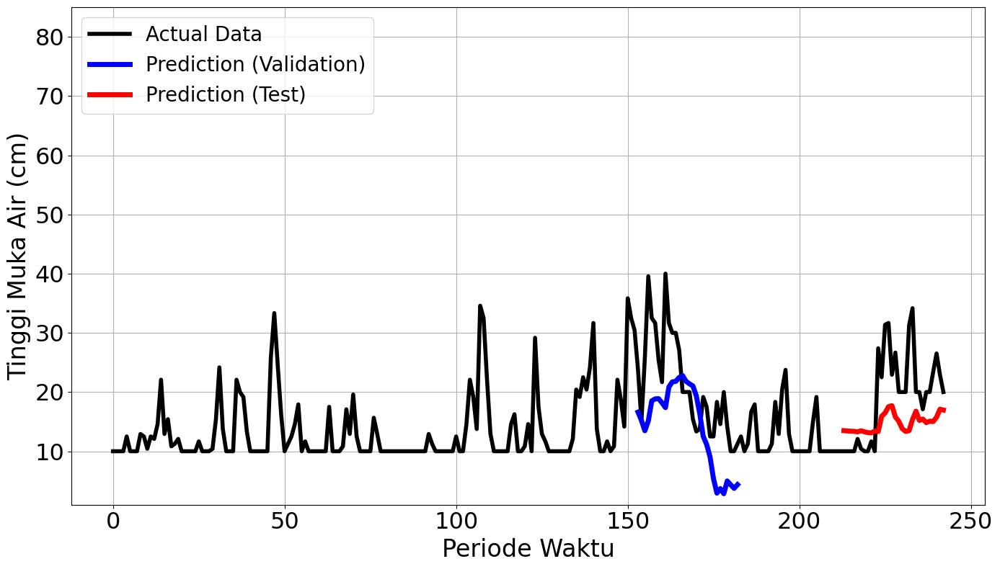

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1153 - val_loss: 0.1507
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0296 - val_loss: 0.0870
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0347 - val_loss: 0.0568
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0201 - val_loss: 0.0444
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0155 - val_loss: 0.0449
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0185 - val_loss: 0.0394
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0157 - val_loss: 0.0389
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - val_loss: 0.0398
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0147 - val_loss: 0.0382
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0148 - val_loss: 0.0418
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0140 - val_loss: 0.0519
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0

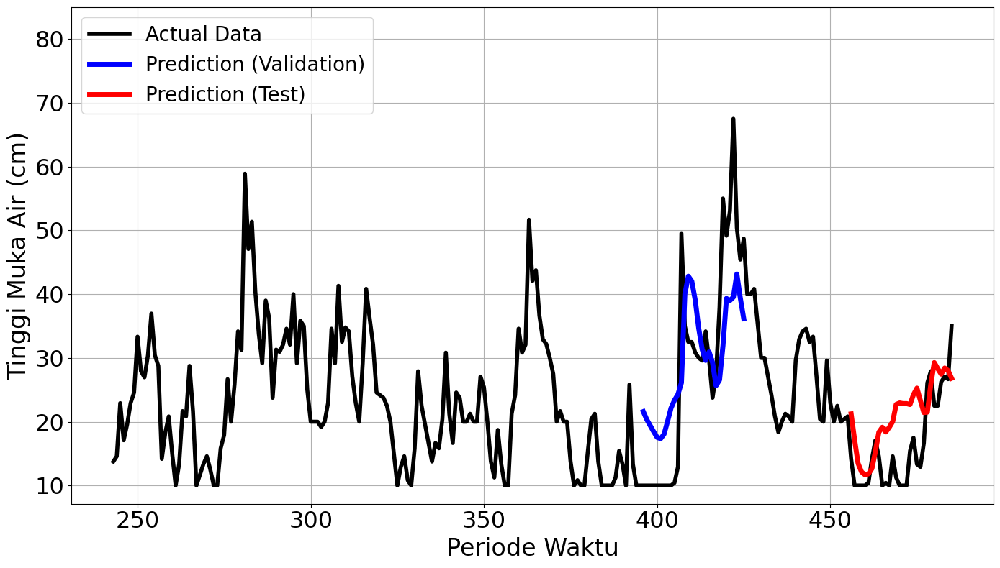

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0616 - val_loss: 0.0124
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0208 - val_loss: 0.0013
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0106 - val_loss: 7.1371e-04
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0055 - val_loss: 5.6523e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0073 - val_loss: 3.2272e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0040 - val_loss: 1.9302e-04
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0041 - val_loss: 2.2233e-04
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0034 - val_loss: 6.7462e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0047 - val_loss: 1.6070e-04
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0036 - val_loss: 5.0680e-04
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0011 - val_loss: 2.6865e-04
Epoch 12/150
93/93 ━━━━━━━━━

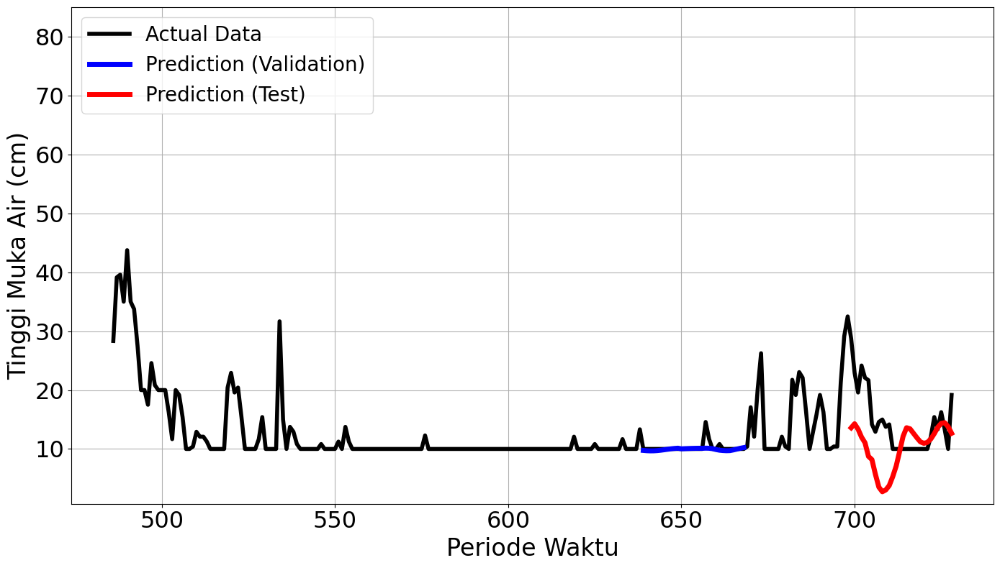

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.0893 - val_loss: 0.0202
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0197 - val_loss: 0.0175
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0177 - val_loss: 0.0104
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0179 - val_loss: 0.0080
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0164 - val_loss: 0.0106
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0120 - val_loss: 0.0097
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0147 - val_loss: 0.0065
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0119 - val_loss: 0.0112
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0123 - val_loss: 0.0097
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0151 - val_loss: 0.0050
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0117 - val_loss: 0.0058
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0

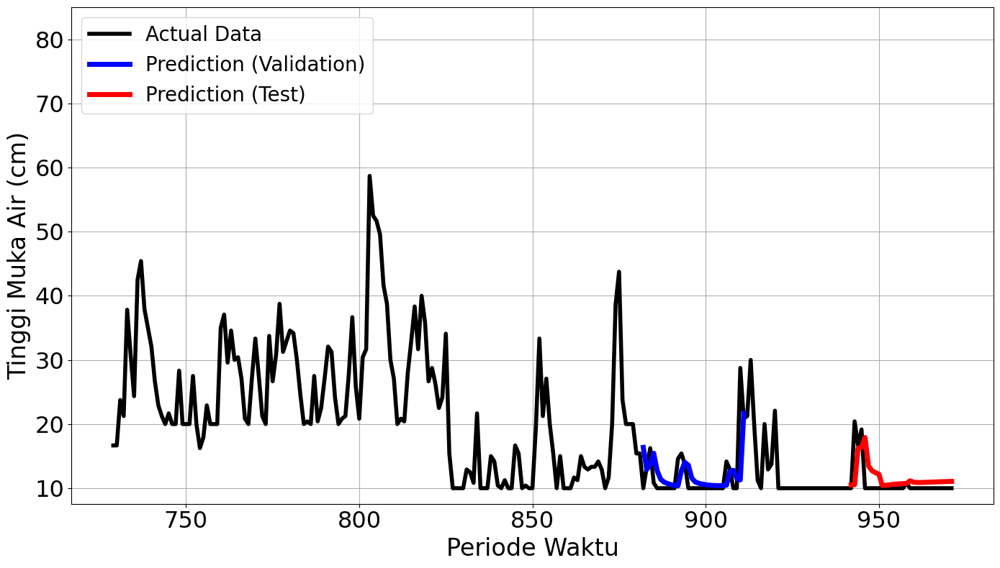

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0579 - val_loss: 0.0638
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0240 - val_loss: 0.0278
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0208 - val_loss: 0.0231
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0148 - val_loss: 0.0282
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0137 - val_loss: 0.0251
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0135 - val_loss: 0.0276
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0088 - val_loss: 0.0273
Epoch 8/150
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0126Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0125 - val_loss: 0.0250
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 33.80614198578037 %
mape test = 13.609592872819617 %


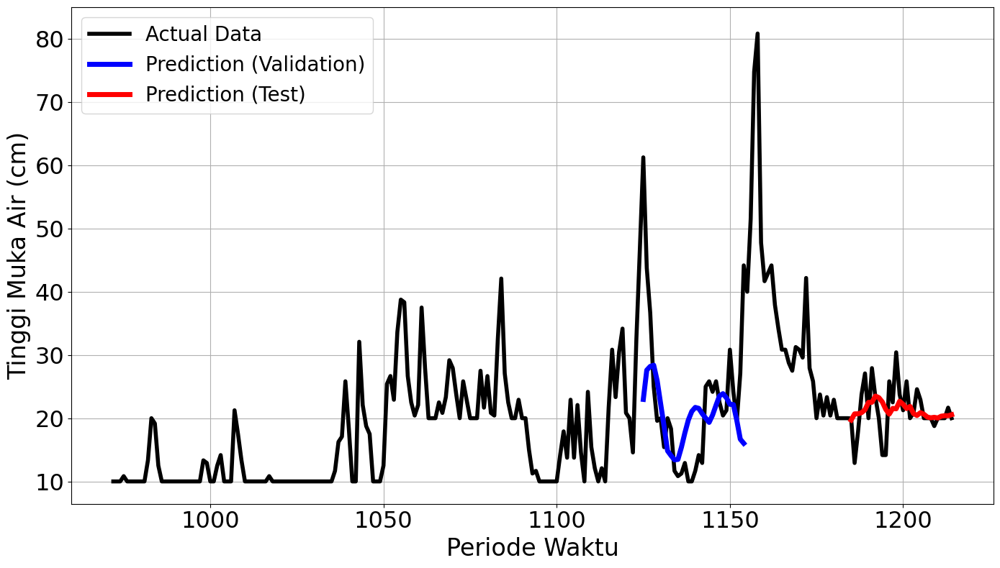

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2858
Final Average MAPE Test: 0.2849
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0909 - val_loss: 0.0294
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0102 - val_loss: 0.0461
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0105 - val_loss: 0.0228
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0104 - val_loss: 0.0337
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0079 - val_loss: 0.0205
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - val_loss: 0.0276
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0041 - val_loss: 0.0249
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0039 - val_loss: 0.0351
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0063 - val_loss: 0.0367
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0064Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0063 - val_loss: 0.0377
Epoch 00010: early stopping
30/30 ━━━━━━━

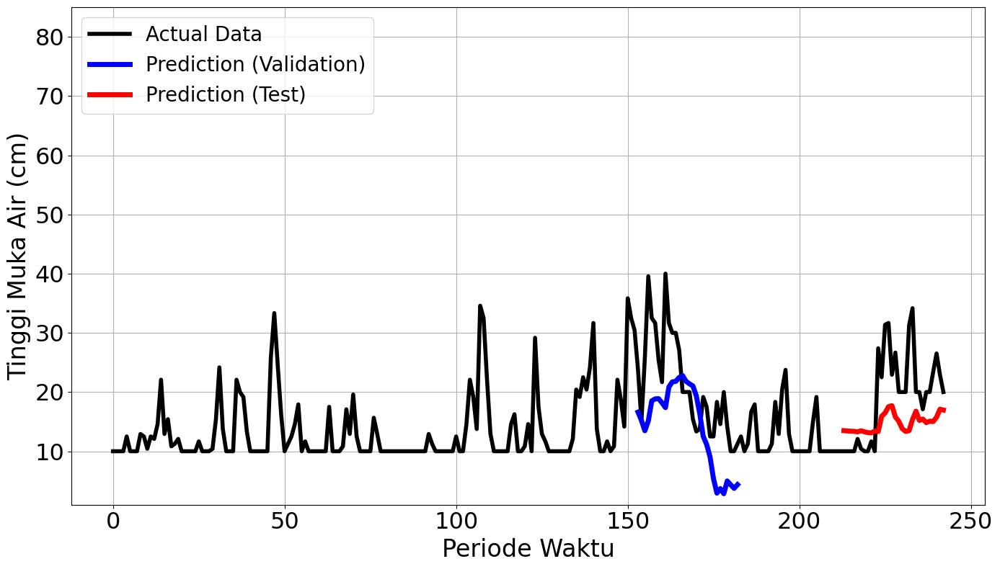

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1153 - val_loss: 0.1507
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0296 - val_loss: 0.0870
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0347 - val_loss: 0.0568
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0201 - val_loss: 0.0444
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0155 - val_loss: 0.0449
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0185 - val_loss: 0.0394
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0157 - val_loss: 0.0389
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0094 - val_loss: 0.0398
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0147 - val_loss: 0.0382
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0148 - val_loss: 0.0418
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0140 - val_loss: 0.0519
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0

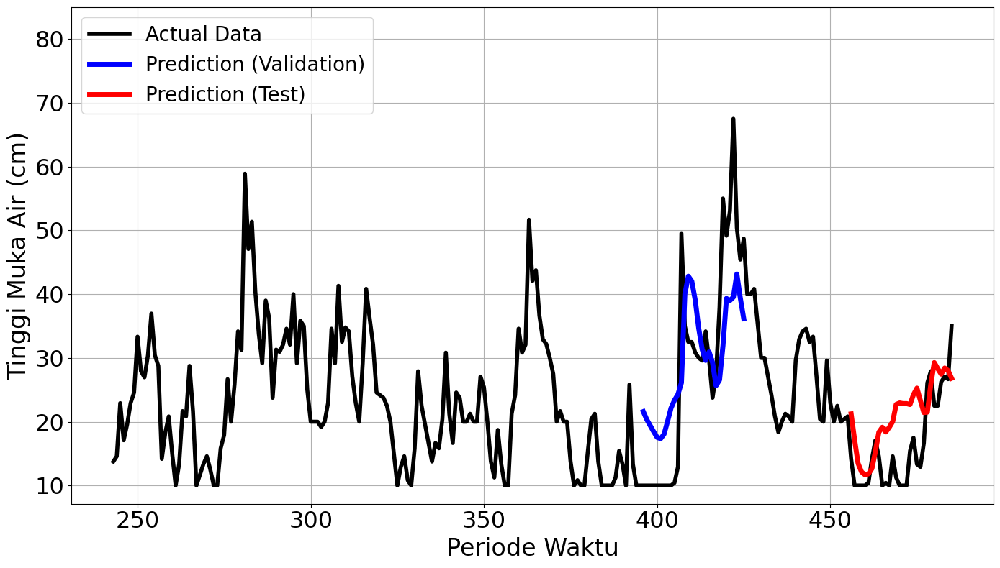

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0616 - val_loss: 0.0124
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0208 - val_loss: 0.0013
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0106 - val_loss: 7.1371e-04
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0055 - val_loss: 5.6523e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0073 - val_loss: 3.2272e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0040 - val_loss: 1.9302e-04
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0041 - val_loss: 2.2233e-04
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0034 - val_loss: 6.7462e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0047 - val_loss: 1.6070e-04
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0036 - val_loss: 5.0680e-04
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0011 - val_loss: 2.6865e-04
Epoch 12/150
93/93 ━━━━━━━━━

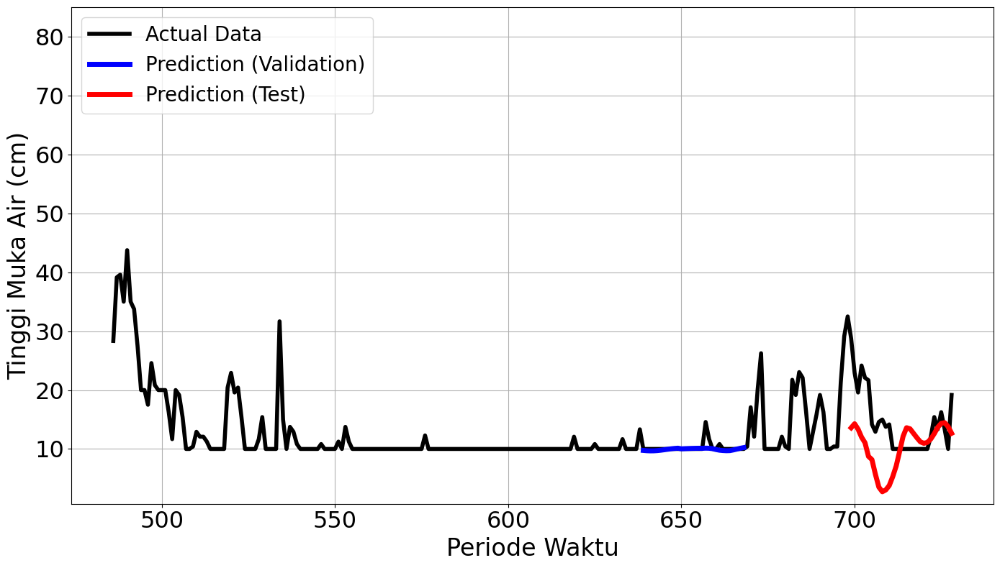

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0893 - val_loss: 0.0202
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0197 - val_loss: 0.0175
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0177 - val_loss: 0.0104
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0179 - val_loss: 0.0080
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0164 - val_loss: 0.0106
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0120 - val_loss: 0.0097
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0147 - val_loss: 0.0065
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0119 - val_loss: 0.0112
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0123 - val_loss: 0.0097
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0151 - val_loss: 0.0050
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0117 - val_loss: 0.0058
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0

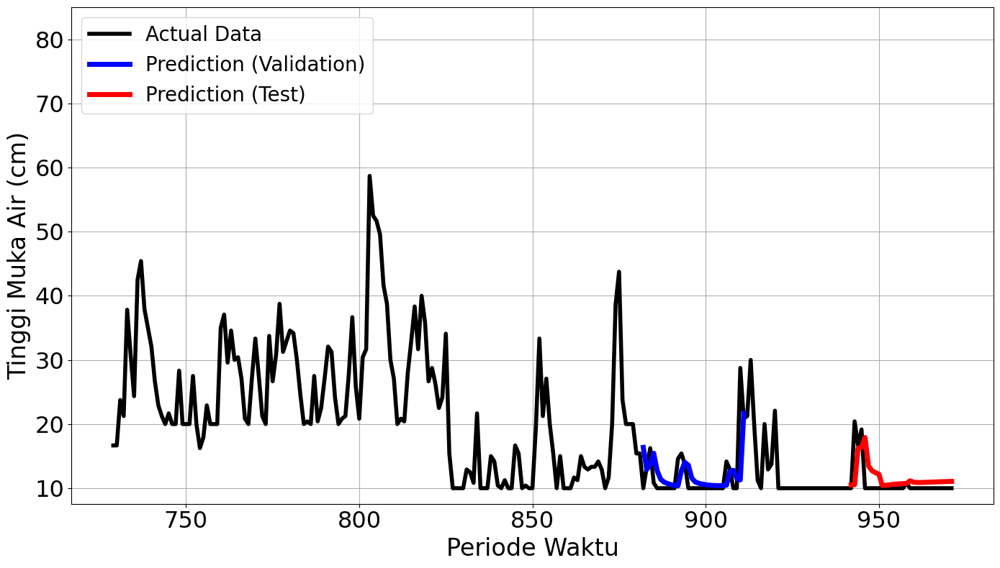

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.0579 - val_loss: 0.0638
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0240 - val_loss: 0.0278
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0208 - val_loss: 0.0231
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0148 - val_loss: 0.0282
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0137 - val_loss: 0.0251
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0135 - val_loss: 0.0276
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0088 - val_loss: 0.0273
Epoch 8/150
91/93 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0126Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0125 - val_loss: 0.0250
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 33.80614198578037 %
mape test = 13.609592872819617 %


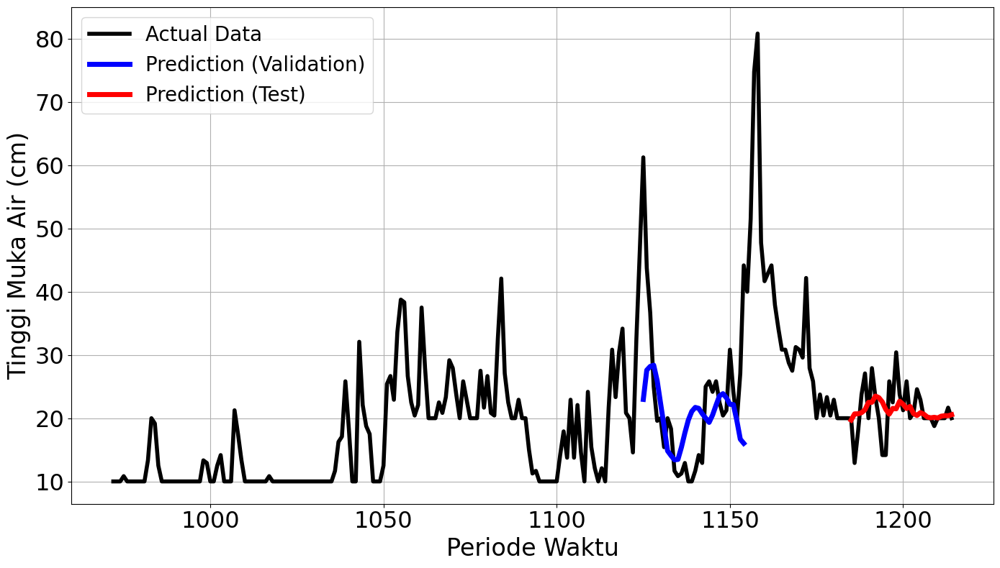

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2858
Final Average MAPE Test: 0.2849
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1353 - val_loss: 0.0841
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0371 - val_loss: 0.0490
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0437 - val_loss: 0.0156
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0211 - val_loss: 0.0193
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0179 - val_loss: 0.0192
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0299 - val_loss: 0.0232
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0147 - val_loss: 0.0223
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0134 - val_loss: 0.0135
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0159 - val_loss: 0.0219
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0109 - val_loss: 0.0366
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0113 - val_loss: 0.0447
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0126 - val_loss: 0.0398


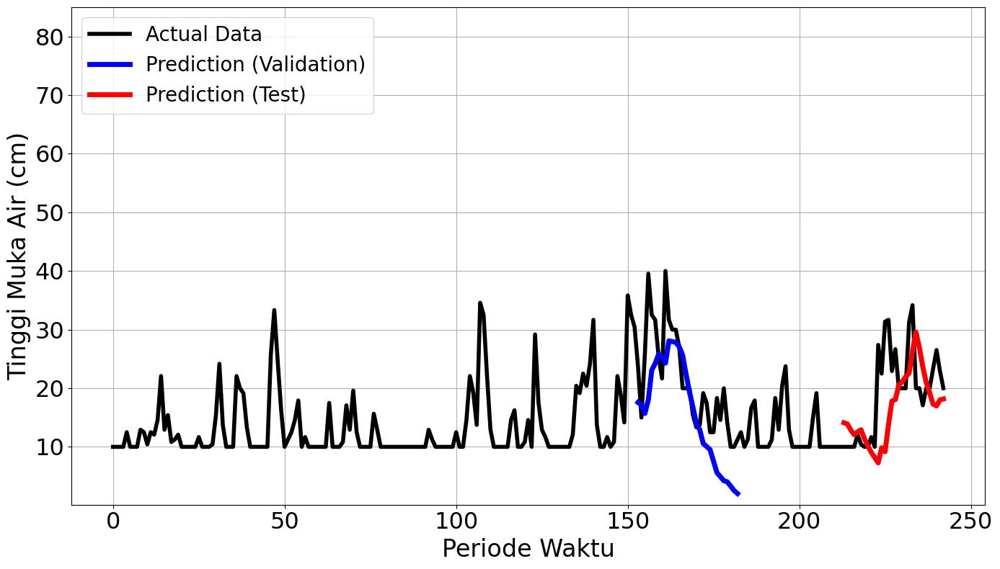

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 144ms/step - loss: 0.0945 - val_loss: 0.1370
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0694 - val_loss: 0.1461
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0611 - val_loss: 0.1313
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0336 - val_loss: 0.1280
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0352 - val_loss: 0.1299
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0355 - val_loss: 0.0946
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0222 - val_loss: 0.0882
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0300 - val_loss: 0.0951
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0417 - val_loss: 0.0876
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0271 - val_loss: 0.1165
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0201 - val_loss: 0.1375
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0175 - val_loss: 0.1309


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 320ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
mape validation = 120.9302297235272 %
mape test = 88.35143588093693 %


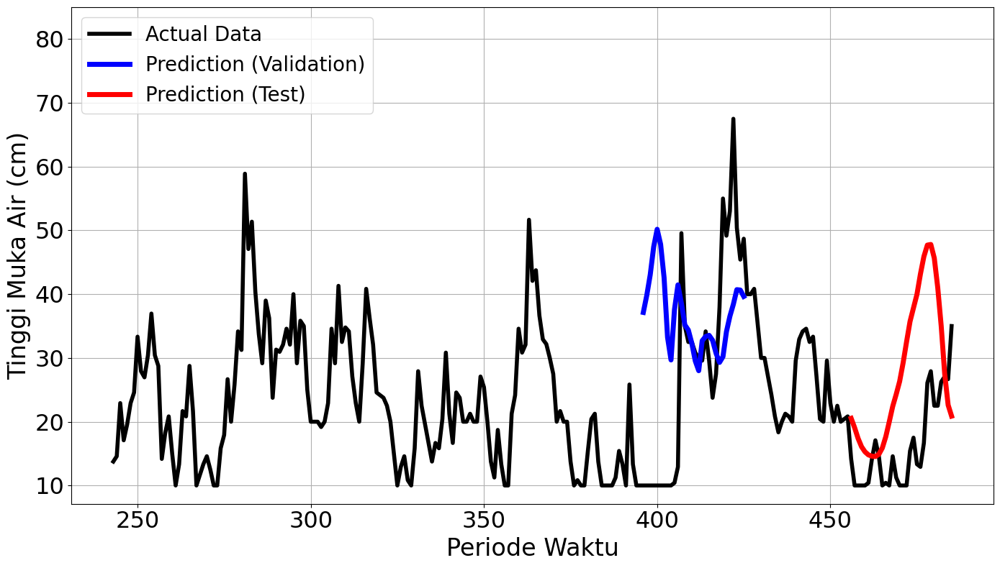

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.0811 - val_loss: 0.0018
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0499 - val_loss: 0.0021
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0329 - val_loss: 6.8103e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0159 - val_loss: 3.1983e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0110 - val_loss: 4.4195e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - val_loss: 6.5393e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0063 - val_loss: 6.5832e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0088 - val_loss: 5.9417e-04
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0079 - val_loss: 6.0076e-04
Epoch 00009: early stopping


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 386ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
mape validation = 8.723092614451874 %
mape test = 70.17058076774804 %


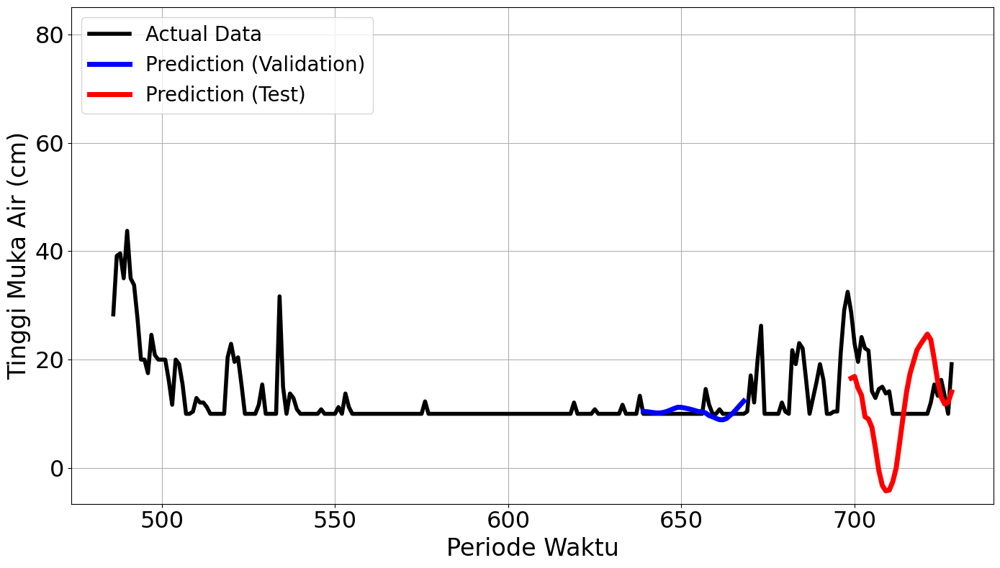

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.1338 - val_loss: 0.0861
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0617 - val_loss: 0.0142
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0511 - val_loss: 0.0073
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0483 - val_loss: 0.0062
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0524 - val_loss: 0.0137
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0325 - val_loss: 0.0202
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0265 - val_loss: 0.0289
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0255 - val_loss: 0.0281
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0211Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0219 - val_loss: 0.0108
Epoch 00009: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 348ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
mape validation = 37.402007150799136 %
map

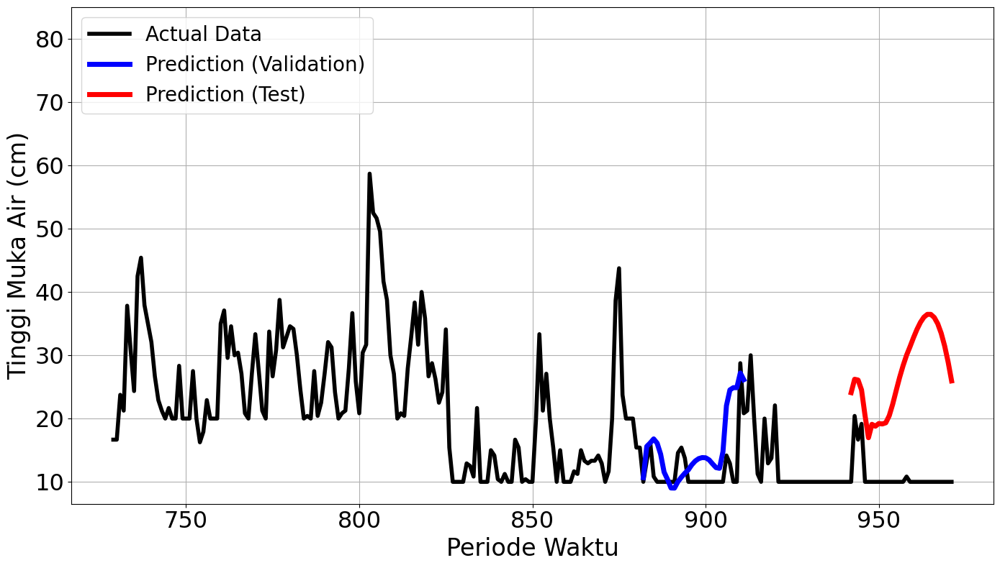

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1058 - val_loss: 0.1087
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0677 - val_loss: 0.0447
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0260 - val_loss: 0.0433
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0455 - val_loss: 0.0289
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0310 - val_loss: 0.0257
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0336 - val_loss: 0.0216
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0188 - val_loss: 0.0228
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0175 - val_loss: 0.0244
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0195 - val_loss: 0.0234
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0173 - val_loss: 0.0275
Epoch 11/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0111Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0

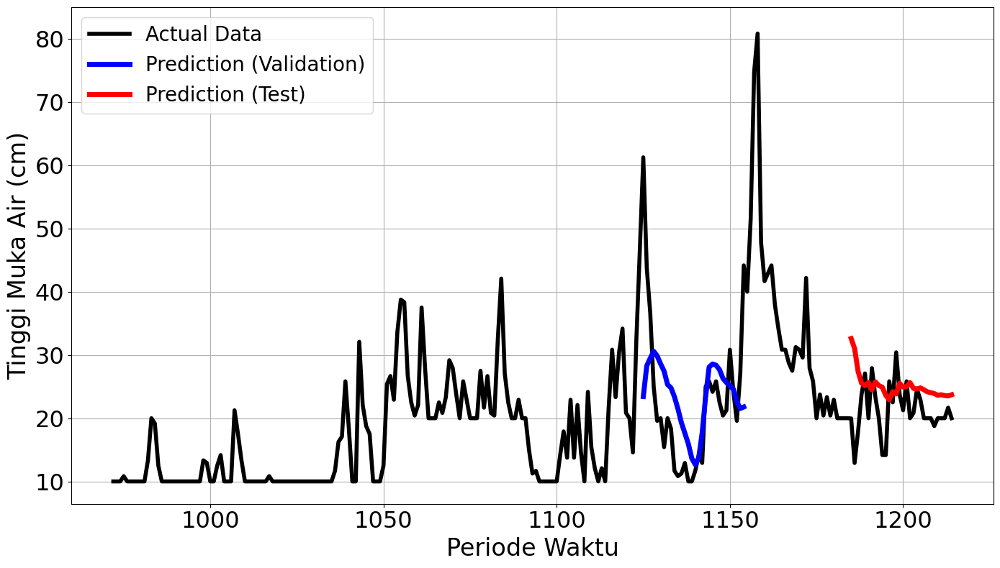

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4702
Final Average MAPE Test: 0.7447
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 134ms/step - loss: 0.1353 - val_loss: 0.0841
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0371 - val_loss: 0.0490
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0437 - val_loss: 0.0156
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0211 - val_loss: 0.0193
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0179 - val_loss: 0.0192
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0299 - val_loss: 0.0232
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0147 - val_loss: 0.0223
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0134 - val_loss: 0.0135
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0159 - val_loss: 0.0219
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0109 - val_loss: 0.0366
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0113 - val_loss: 0.0447
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0126 - val_loss: 0.0398


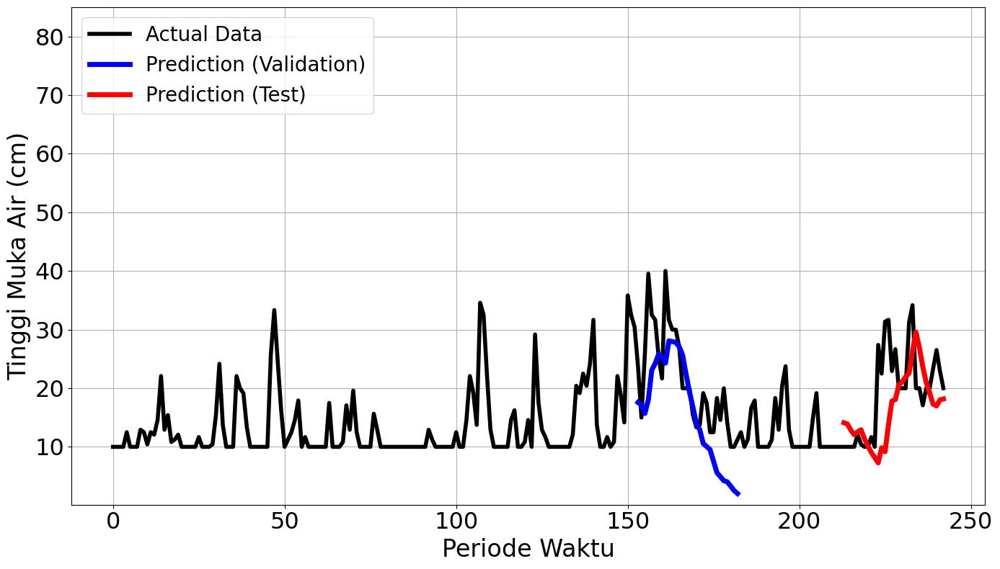

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0945 - val_loss: 0.1370
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0694 - val_loss: 0.1461
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0611 - val_loss: 0.1313
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0336 - val_loss: 0.1280
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0352 - val_loss: 0.1299
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0355 - val_loss: 0.0946
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0222 - val_loss: 0.0882
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0300 - val_loss: 0.0951
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0417 - val_loss: 0.0876
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0271 - val_loss: 0.1165
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0201 - val_loss: 0.1375
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0175 - val_loss: 0.1309


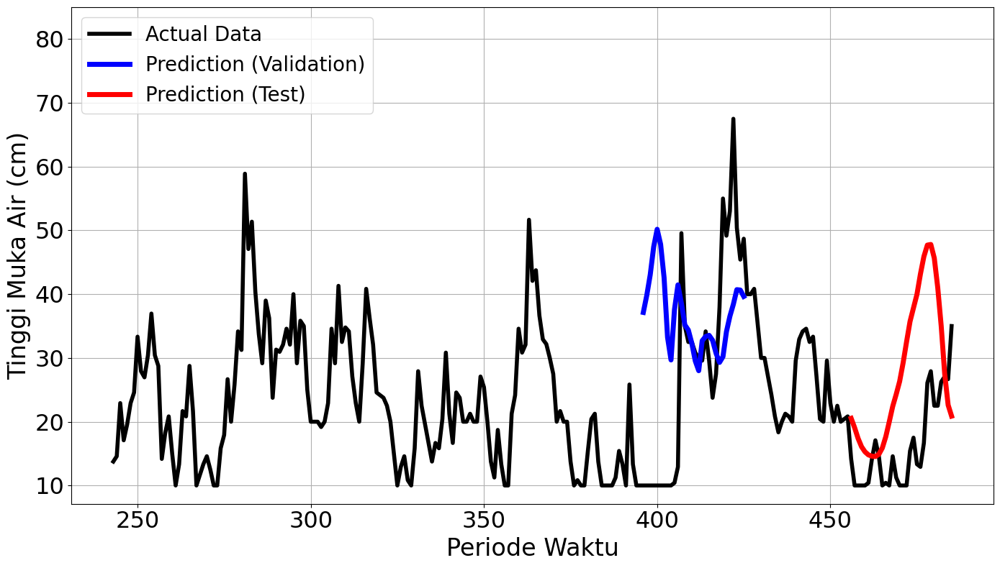

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0811 - val_loss: 0.0018
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0499 - val_loss: 0.0021
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0329 - val_loss: 6.8103e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0159 - val_loss: 3.1983e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0110 - val_loss: 4.4195e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0095 - val_loss: 6.5393e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0063 - val_loss: 6.5832e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0088 - val_loss: 5.9417e-04
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0083Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0079 - val_loss: 6.0076e-04
Epoch 00009: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 334ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
mape validatio

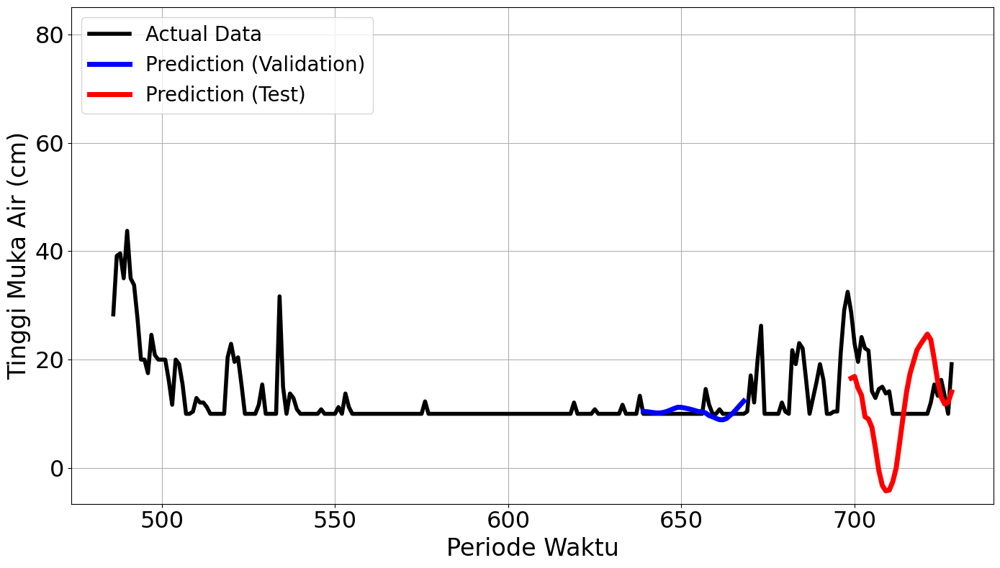

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1338 - val_loss: 0.0861
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0617 - val_loss: 0.0142
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0511 - val_loss: 0.0073
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0483 - val_loss: 0.0062
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0524 - val_loss: 0.0137
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0325 - val_loss: 0.0202
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0265 - val_loss: 0.0289
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0255 - val_loss: 0.0281
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0211Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0219 - val_loss: 0.0108
Epoch 00009: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 341ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
mape validation = 37.402007150799136 %
map

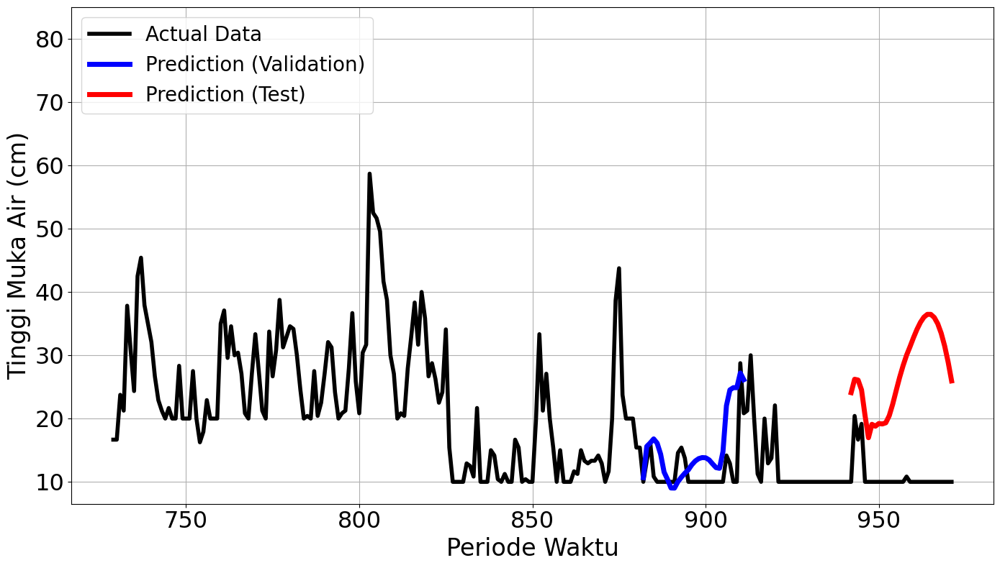

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 187ms/step - loss: 0.1058 - val_loss: 0.1087
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0677 - val_loss: 0.0447
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0260 - val_loss: 0.0433
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0455 - val_loss: 0.0289
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0310 - val_loss: 0.0257
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0336 - val_loss: 0.0216
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0188 - val_loss: 0.0228
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0175 - val_loss: 0.0244
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0195 - val_loss: 0.0234
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0173 - val_loss: 0.0275
Epoch 11/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0111Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0

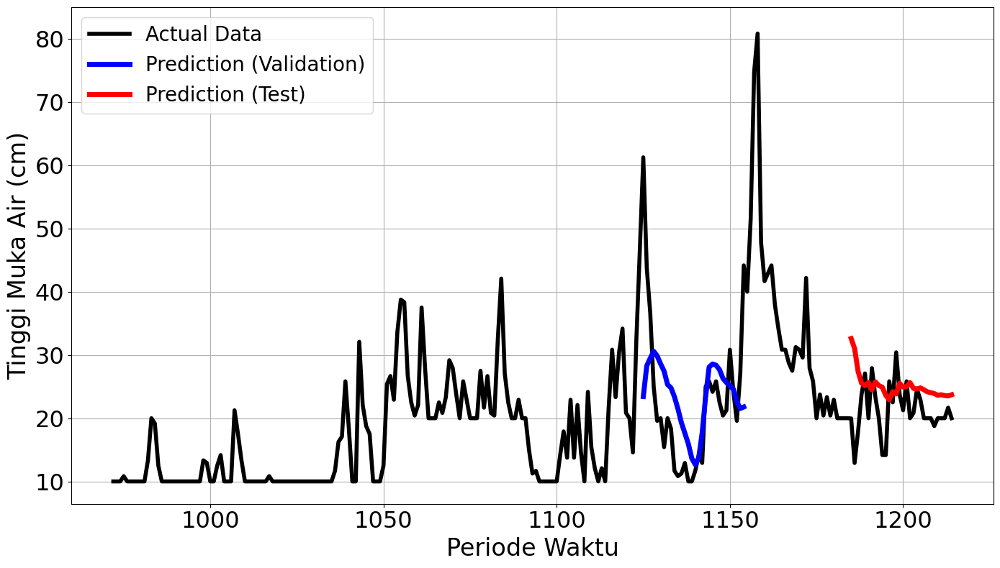

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4702
Final Average MAPE Test: 0.7447
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 587ms/step - loss: 0.2291 - val_loss: 0.0726
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0584 - val_loss: 0.1197
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0309 - val_loss: 0.1293
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0400 - val_loss: 0.1139
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0441 - val_loss: 0.0757
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0232 - val_loss: 0.0450
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0192 - val_loss: 0.0298
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0358 - val_loss: 0.0302
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0207 - val_loss: 0.0315
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0190 - val_loss: 0.0344
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0225 - val_loss: 0.0343
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0159 Restoring model 

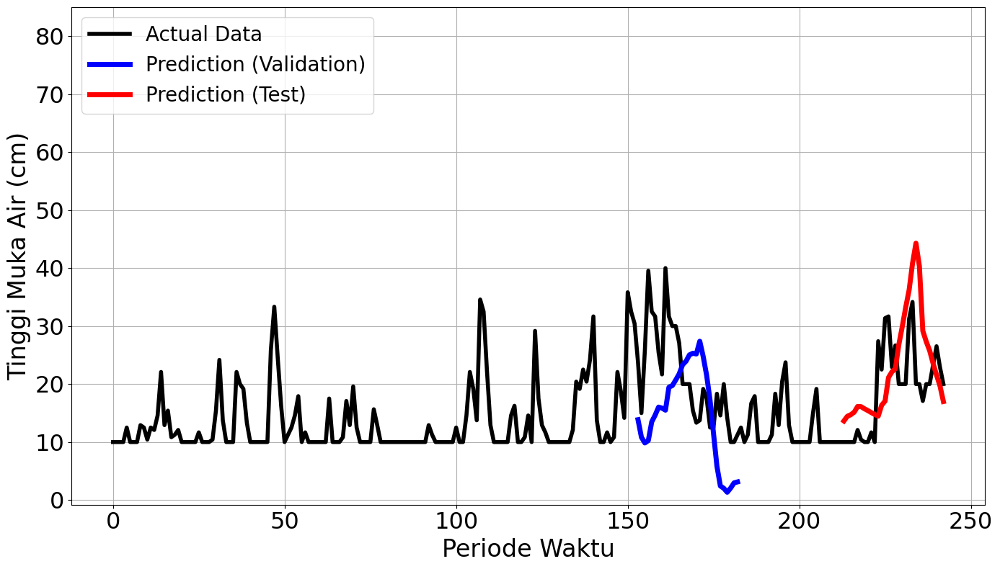

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 589ms/step - loss: 0.0756 - val_loss: 0.1875
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1016 - val_loss: 0.1571
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0626 - val_loss: 0.1334
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0781 - val_loss: 0.1378
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0711 - val_loss: 0.1383
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0533 - val_loss: 0.1307
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0531 - val_loss: 0.1268
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0449 - val_loss: 0.1225
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0518 - val_loss: 0.1218
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0516 - val_loss: 0.1202
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0390 - val_loss: 0.1211
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0517 -

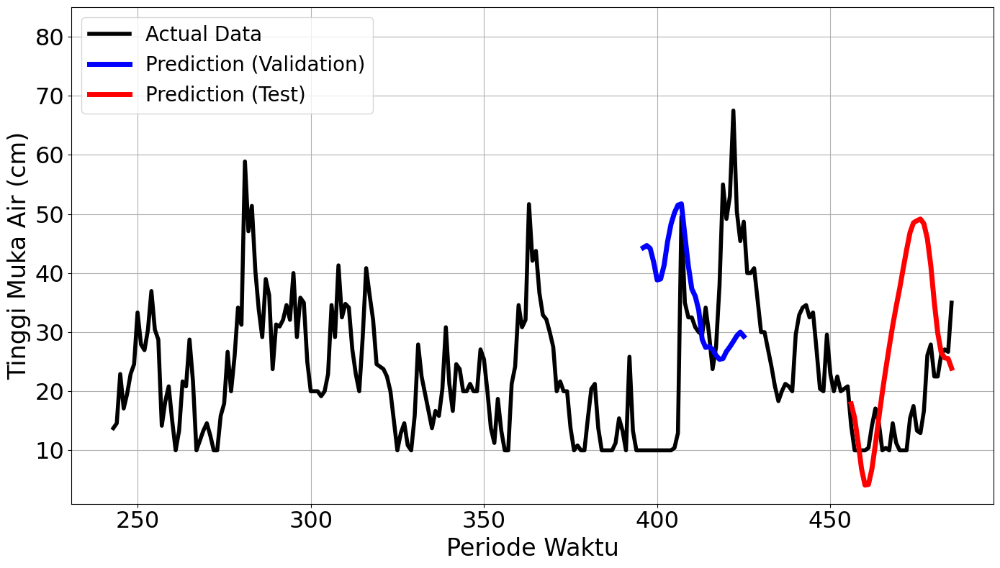

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 565ms/step - loss: 0.2089 - val_loss: 0.0015
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0310 - val_loss: 0.0086
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0287 - val_loss: 0.0051
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0231 - val_loss: 9.0254e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0257 - val_loss: 0.0010
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0195 - val_loss: 0.0028
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0252 - val_loss: 0.0039
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0163 - val_loss: 0.0025
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0099Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0122 - val_loss: 0.0015
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
mape validation = 17.76509998864336

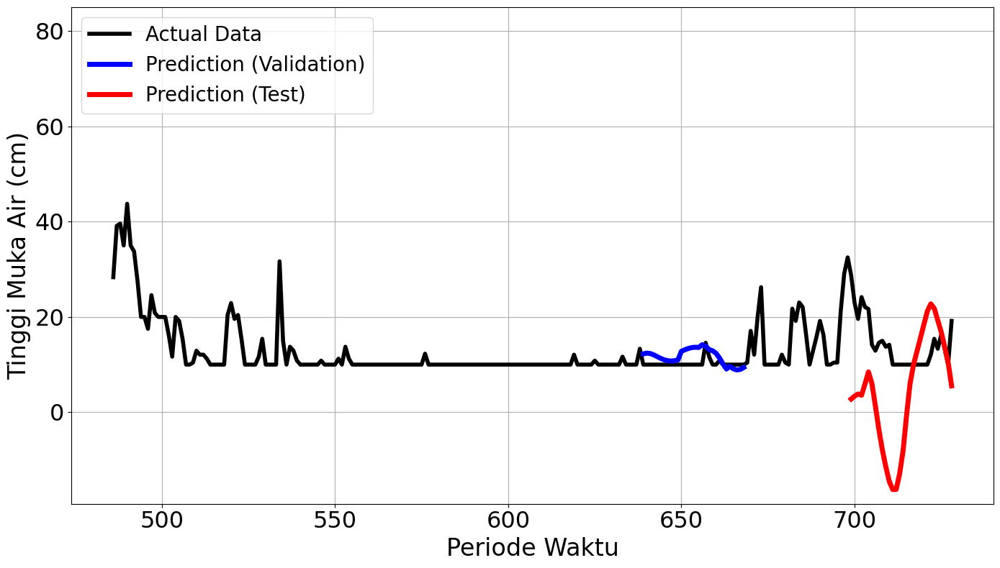

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 596ms/step - loss: 0.1433 - val_loss: 0.2526
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1576 - val_loss: 0.1052
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0708 - val_loss: 0.0198
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0553 - val_loss: 0.0120
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0464 - val_loss: 0.0348
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0493 - val_loss: 0.0428
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0500 - val_loss: 0.0366
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0528 - val_loss: 0.0228
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0479 - val_loss: 0.0116
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - loss: 0.0456 - val_loss: 0.0070
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - loss: 0.0336 - val_loss: 0.0067
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - loss: 0.0384 - val_loss:

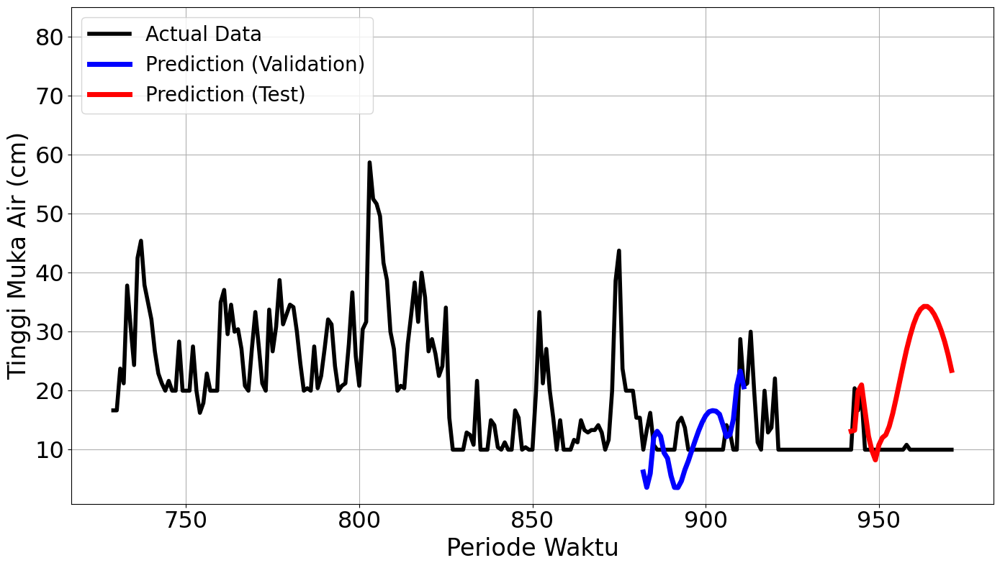

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 542ms/step - loss: 0.1551 - val_loss: 0.0215
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0589 - val_loss: 0.0401
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0597 - val_loss: 0.0463
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0575 - val_loss: 0.0458
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0403 - val_loss: 0.0409
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0404Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0387 - val_loss: 0.0364
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
mape validation = 36.58919946798439 %
mape test = 18.553298379146643 %


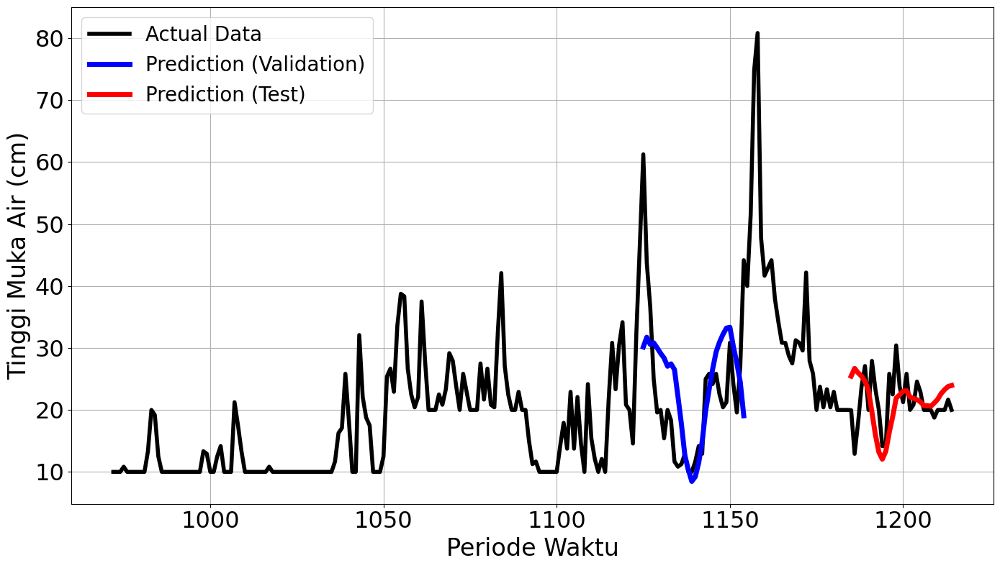

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5708
Final Average MAPE Test: 0.7734
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 654ms/step - loss: 0.2291 - val_loss: 0.0726
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0584 - val_loss: 0.1197
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0309 - val_loss: 0.1293
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0400 - val_loss: 0.1139
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0441 - val_loss: 0.0757
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0232 - val_loss: 0.0450
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0192 - val_loss: 0.0298
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0358 - val_loss: 0.0302
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0207 - val_loss: 0.0315
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0190 - val_loss: 0.0344
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0225 - val_loss: 0.0343
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0159Restoring mod

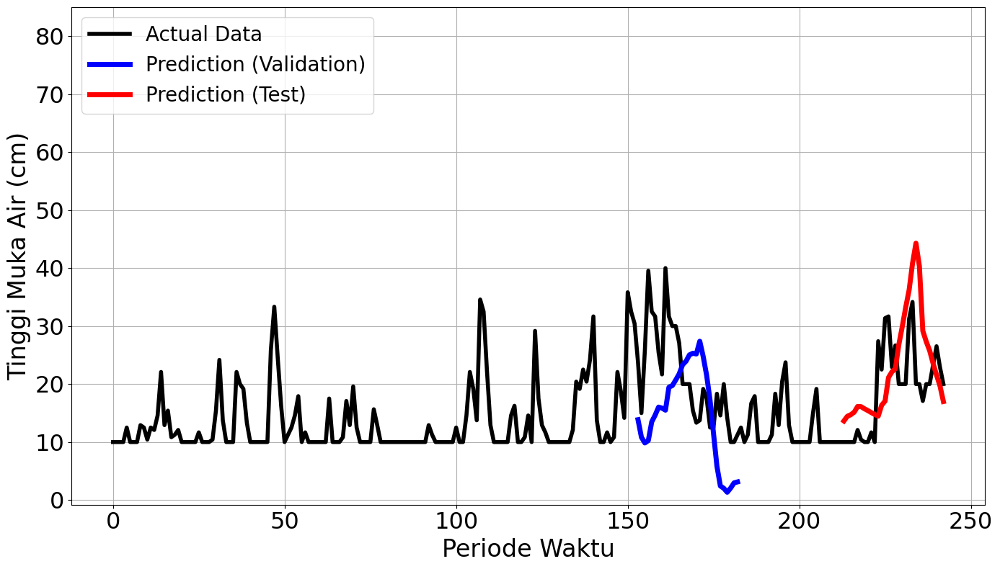

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 594ms/step - loss: 0.0756 - val_loss: 0.1875
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.1016 - val_loss: 0.1571
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0626 - val_loss: 0.1334
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0781 - val_loss: 0.1378
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0711 - val_loss: 0.1383
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0533 - val_loss: 0.1307
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0531 - val_loss: 0.1268
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0449 - val_loss: 0.1225
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0518 - val_loss: 0.1218
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - loss: 0.0516 - val_loss: 0.1202
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0390 - val_loss: 0.1211
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - loss: 0.0517 - val_loss

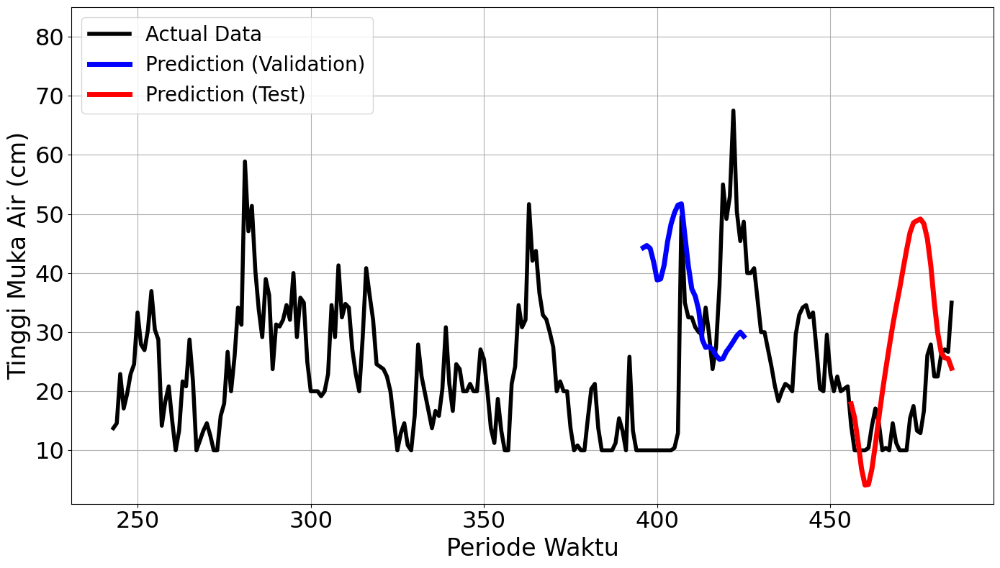

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 565ms/step - loss: 0.2089 - val_loss: 0.0015
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0310 - val_loss: 0.0086
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0287 - val_loss: 0.0051
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0231 - val_loss: 9.0254e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0257 - val_loss: 0.0010
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0195 - val_loss: 0.0028
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0252 - val_loss: 0.0039
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0163 - val_loss: 0.0025
Epoch 9/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0031Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0122 - val_loss: 0.0015
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
mape validation = 17.76509998

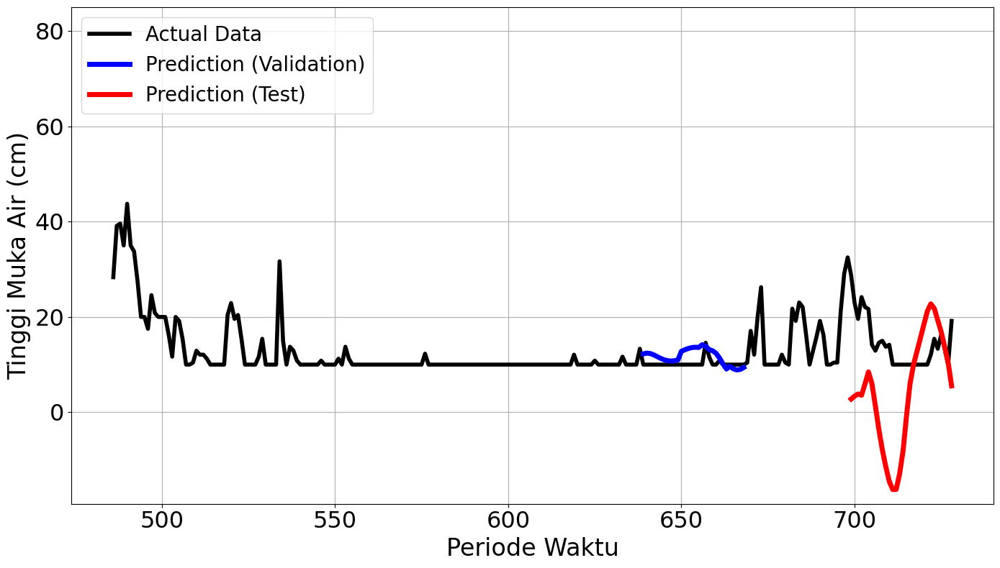

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 835ms/step - loss: 0.1433 - val_loss: 0.2526
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.1576 - val_loss: 0.1052
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0708 - val_loss: 0.0198
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0553 - val_loss: 0.0120
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0464 - val_loss: 0.0348
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0493 - val_loss: 0.0428
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0500 - val_loss: 0.0366
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0528 - val_loss: 0.0228
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0479 - val_loss: 0.0116
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0456 - val_loss: 0.0070
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0336 - val_loss: 0.0067
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0384 - val_loss

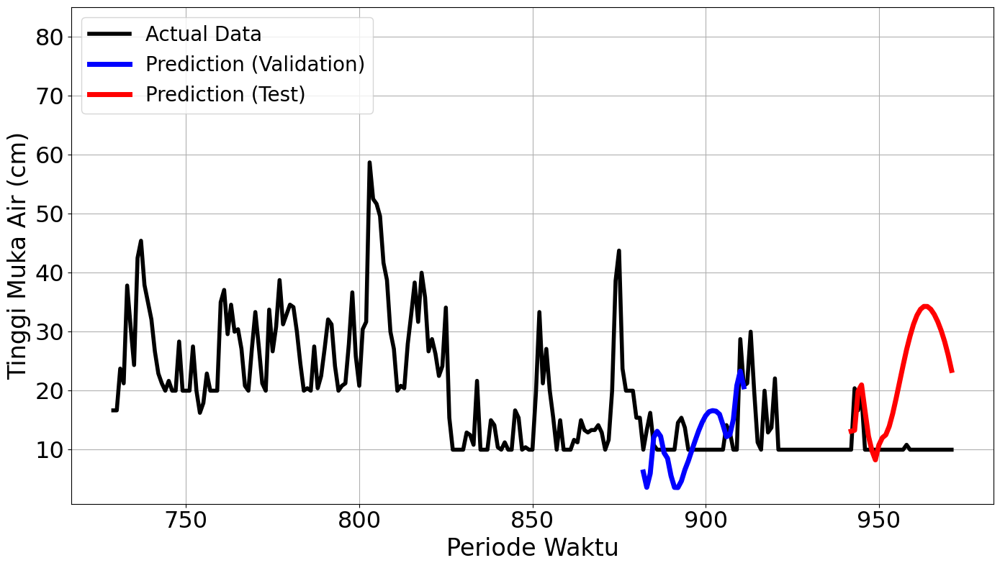

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 564ms/step - loss: 0.1551 - val_loss: 0.0215
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0589 - val_loss: 0.0401
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0597 - val_loss: 0.0463
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0575 - val_loss: 0.0458
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0403 - val_loss: 0.0409
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - loss: 0.0404Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0387 - val_loss: 0.0364
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
mape validation = 36.58919946798439 %
mape test = 18.553298379146643 %


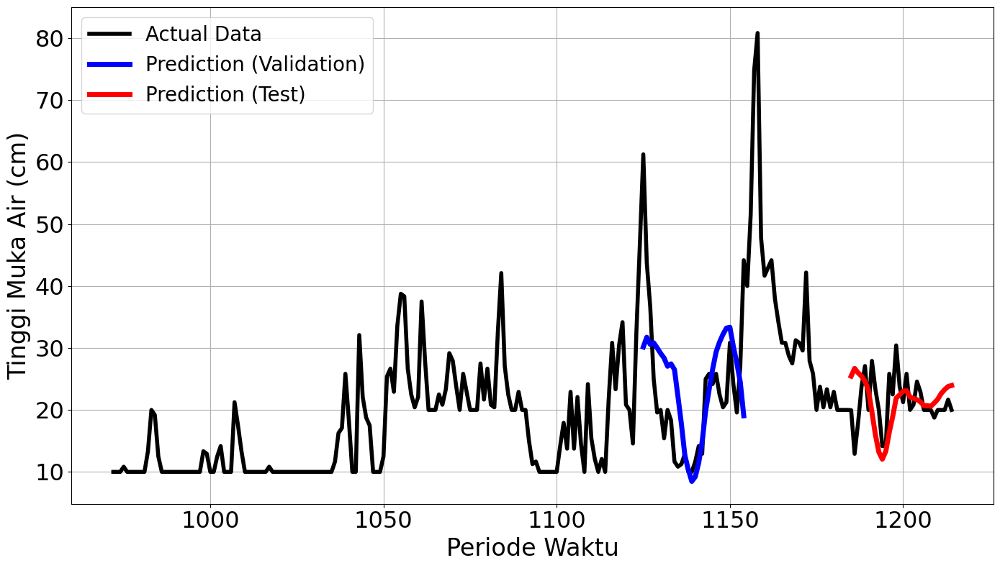

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5708
Final Average MAPE Test: 0.7734
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2074 - val_loss: 0.0547
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.1267 - val_loss: 0.0784
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.0748 - val_loss: 0.0980
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0474 - val_loss: 0.1141
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - loss: 0.0347 - val_loss: 0.1157
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0377Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - loss: 0.0377 - val_loss: 0.1104
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
mape validation = 70.55587050298683 %
mape test = 138.57634802024782 %


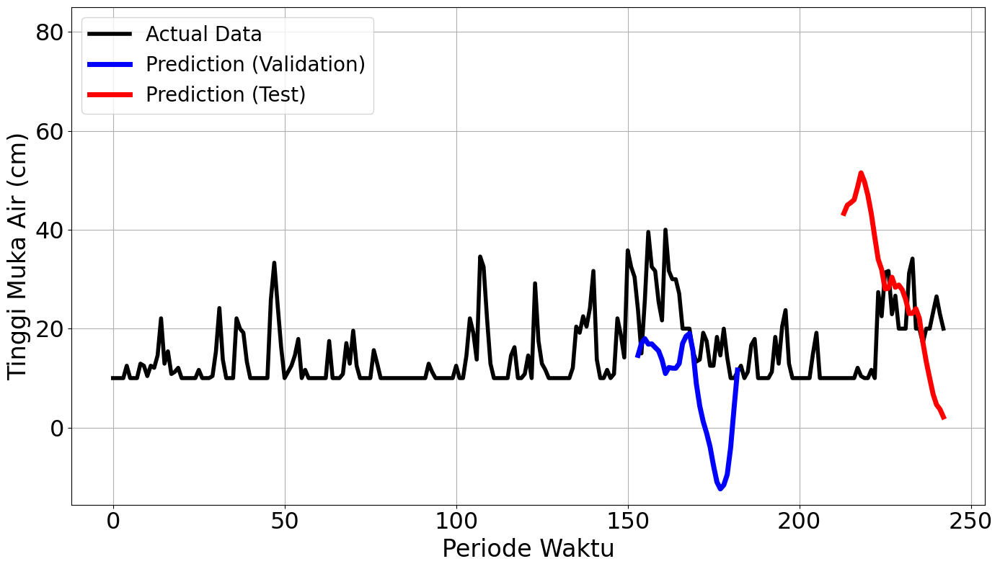

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.0898 - val_loss: 0.1915
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0705 - val_loss: 0.1946
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0653 - val_loss: 0.1878
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - loss: 0.0743 - val_loss: 0.1821
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0682 - val_loss: 0.1757
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.0501 - val_loss: 0.1707
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0422 - val_loss: 0.1683
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step - loss: 0.0365 - val_loss: 0.1653
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - loss: 0.0487 - val_loss: 0.1604
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - loss: 0.0356 - val_loss: 0.1536
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step - loss: 0.0455 - val_loss: 0.1435
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - loss: 0.0350 - val_loss:

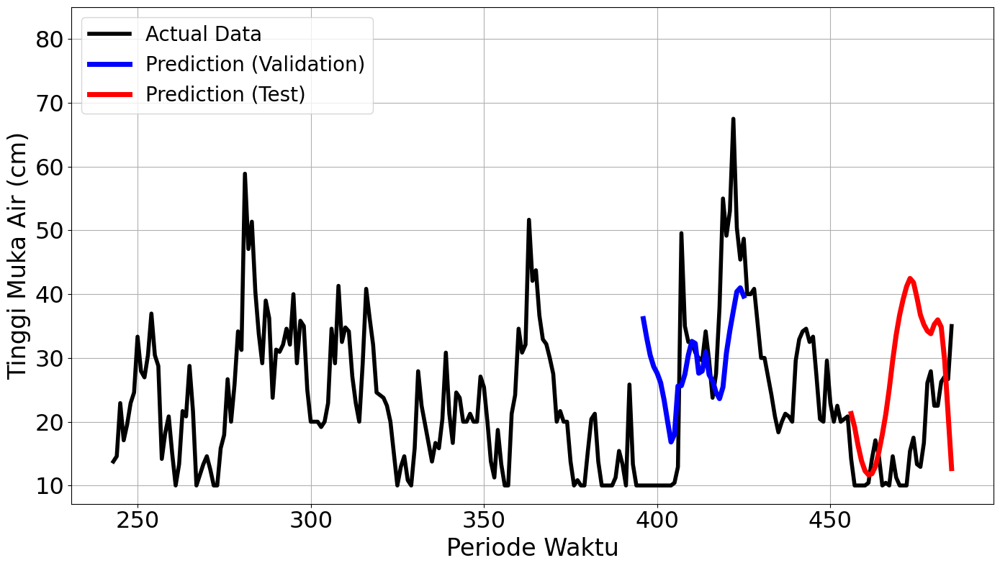

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.1820 - val_loss: 0.0048
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - loss: 0.0856 - val_loss: 0.0066
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step - loss: 0.0601 - val_loss: 0.0027
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0434 - val_loss: 5.0250e-04
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - loss: 0.0307 - val_loss: 0.0011
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step - loss: 0.0471 - val_loss: 0.0022
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step - loss: 0.0483 - val_loss: 0.0022
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step - loss: 0.0397 - val_loss: 0.0015
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step - loss: 0.0365 - val_loss: 3.9644e-04
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - loss: 0.0340 - val_loss: 4.2888e-04
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - loss: 0.0270 - val_loss: 0.0012
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - loss: 0.0216

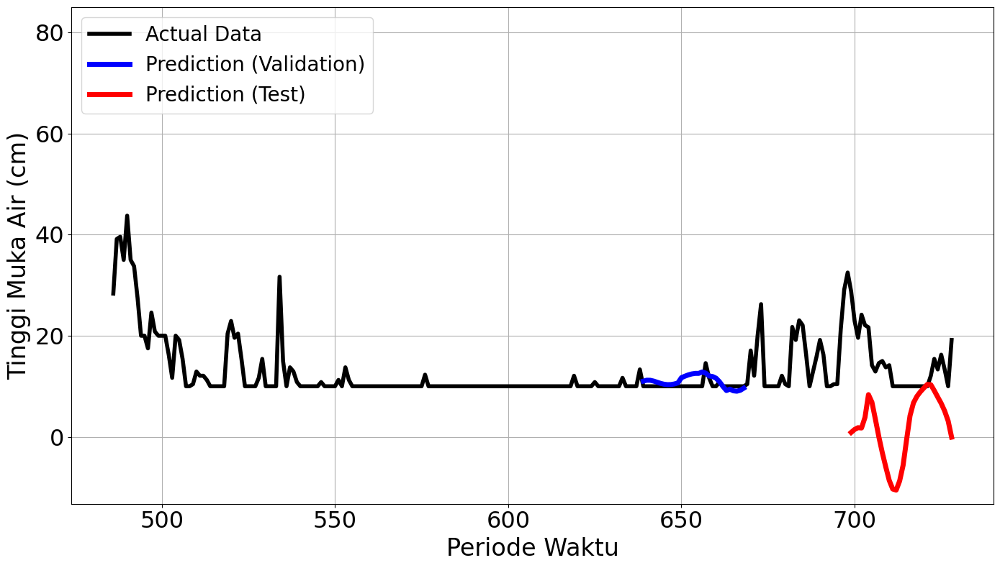

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1535 - val_loss: 0.2566
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - loss: 0.0844 - val_loss: 0.2132
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - loss: 0.0755 - val_loss: 0.1525
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0942 - val_loss: 0.0893
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step - loss: 0.0646 - val_loss: 0.0410
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - loss: 0.0606 - val_loss: 0.0141
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0409 - val_loss: 0.0067
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0455 - val_loss: 0.0093
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0521 - val_loss: 0.0151
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - loss: 0.0484 - val_loss: 0.0203
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0497 - val_loss: 0.0231
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0426Restoring mod

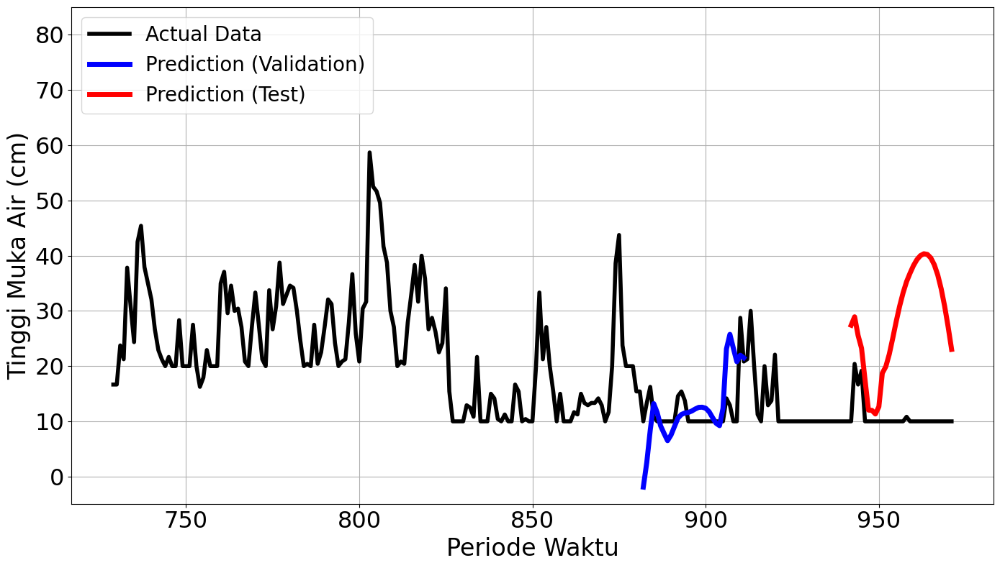

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.1596 - val_loss: 0.0190
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0930 - val_loss: 0.0240
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0744 - val_loss: 0.0265
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.0604 - val_loss: 0.0253
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.0437 - val_loss: 0.0228
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0434Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.0434 - val_loss: 0.0215
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
mape validation = 34.52775568514871 %
mape test = 18.541277531929094 %


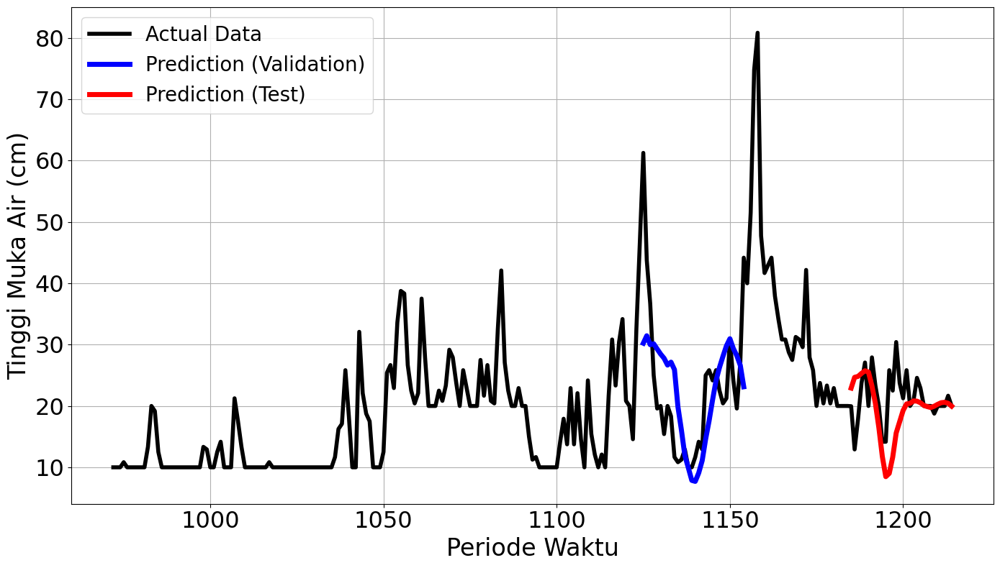

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4437
Final Average MAPE Test: 1.0190
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2074 - val_loss: 0.0547
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - loss: 0.1267 - val_loss: 0.0784
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - loss: 0.0748 - val_loss: 0.0980
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.0474 - val_loss: 0.1141
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - loss: 0.0347 - val_loss: 0.1157
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0377Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - loss: 0.0377 - val_loss: 0.1104
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
mape validation = 70.55587050298683 %
mape test = 138.57634802024782 %


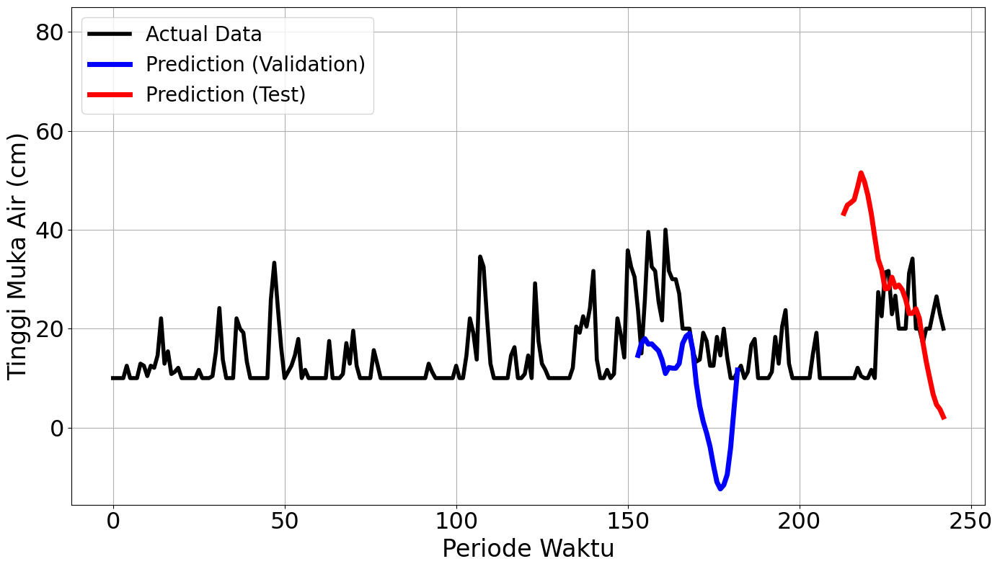

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.0898 - val_loss: 0.1915
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0705 - val_loss: 0.1946
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 0.0653 - val_loss: 0.1878
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0743 - val_loss: 0.1821
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0682 - val_loss: 0.1757
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - loss: 0.0501 - val_loss: 0.1707
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0422 - val_loss: 0.1683
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - loss: 0.0365 - val_loss: 0.1653
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step - loss: 0.0487 - val_loss: 0.1604
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0356 - val_loss: 0.1536
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - loss: 0.0455 - val_loss: 0.1435
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - loss: 0.0350 - val_loss:

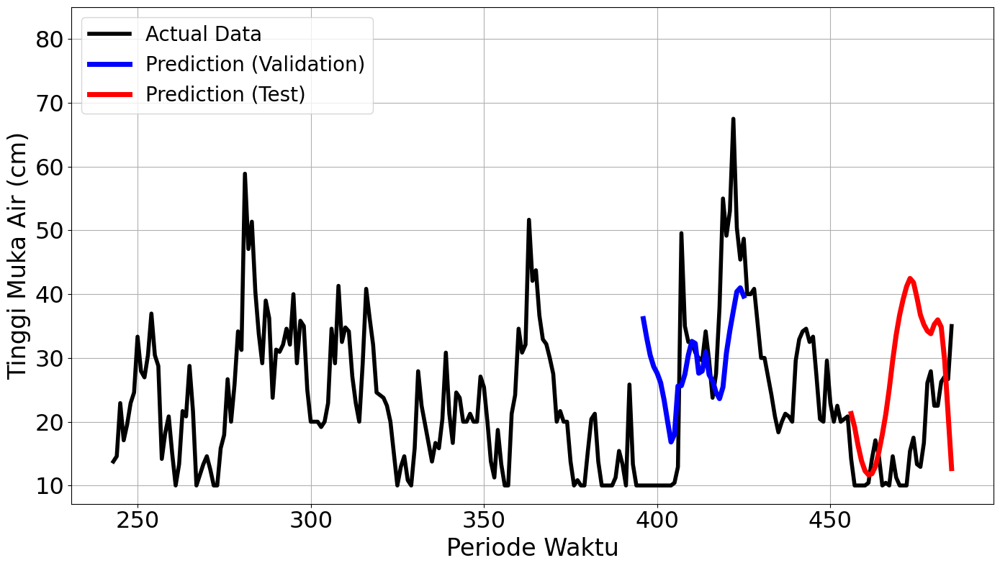

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1820 - val_loss: 0.0048
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - loss: 0.0856 - val_loss: 0.0066
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0601 - val_loss: 0.0027
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step - loss: 0.0434 - val_loss: 5.0250e-04
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - loss: 0.0307 - val_loss: 0.0011
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0471 - val_loss: 0.0022
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - loss: 0.0483 - val_loss: 0.0022
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - loss: 0.0397 - val_loss: 0.0015
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - loss: 0.0365 - val_loss: 3.9644e-04
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - loss: 0.0340 - val_loss: 4.2888e-04
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0270 - val_loss: 0.0012
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - loss: 0.0216

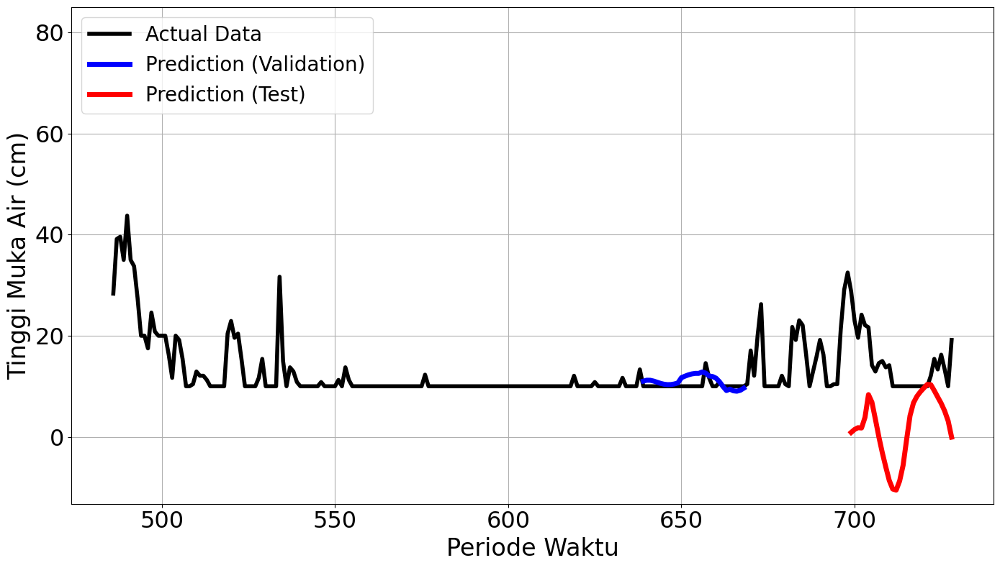

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.1535 - val_loss: 0.2566
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - loss: 0.0844 - val_loss: 0.2132
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step - loss: 0.0755 - val_loss: 0.1525
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - loss: 0.0942 - val_loss: 0.0893
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.0646 - val_loss: 0.0410
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step - loss: 0.0606 - val_loss: 0.0141
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0409 - val_loss: 0.0067
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - loss: 0.0455 - val_loss: 0.0093
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.0521 - val_loss: 0.0151
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0484 - val_loss: 0.0203
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0497 - val_loss: 0.0231
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 0.0426Restoring mo

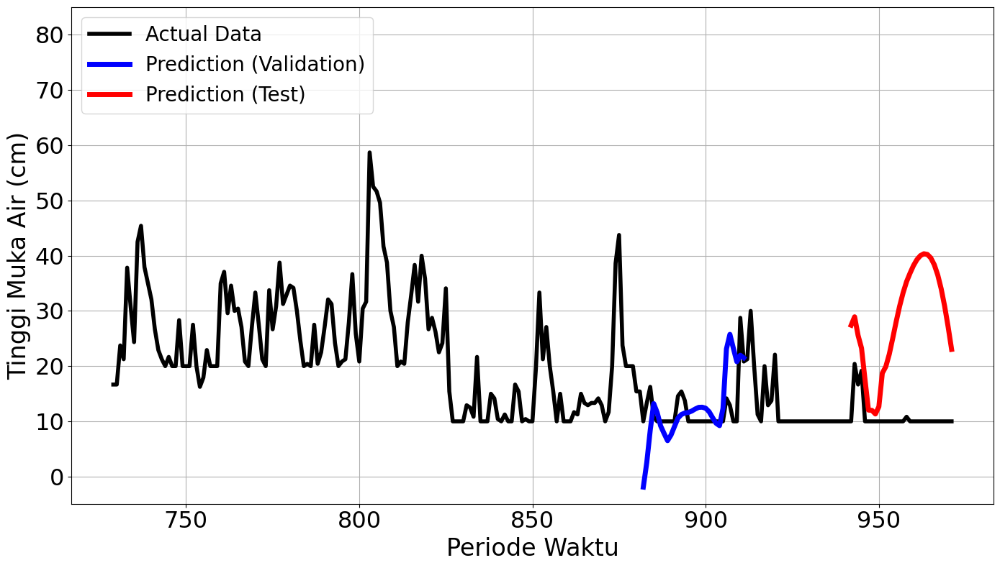

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1596 - val_loss: 0.0190
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 0.0930 - val_loss: 0.0240
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0744 - val_loss: 0.0265
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - loss: 0.0604 - val_loss: 0.0253
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0437 - val_loss: 0.0228
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - loss: 0.0434Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step - loss: 0.0434 - val_loss: 0.0215
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
mape validation = 34.52775568514871 %
mape test = 18.541277531929094 %


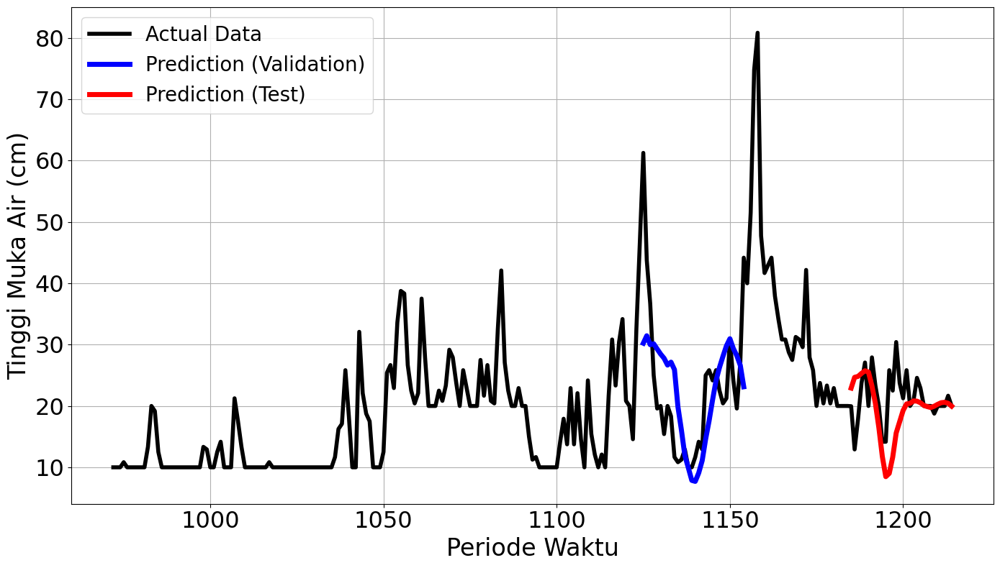

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4437
Final Average MAPE Test: 1.0190
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - loss: 0.0632 - val_loss: 0.0228
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0078 - val_loss: 0.0158
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0048 - val_loss: 0.0137
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0077 - val_loss: 0.0198
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0063 - val_loss: 0.0141
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0065 - val_loss: 0.0221
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0035 - val_loss: 0.0198
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0031Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0032 - val_loss: 0.0253
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
mape validation = 26.048629398261834 %
mape test = 30.851117327650417 %


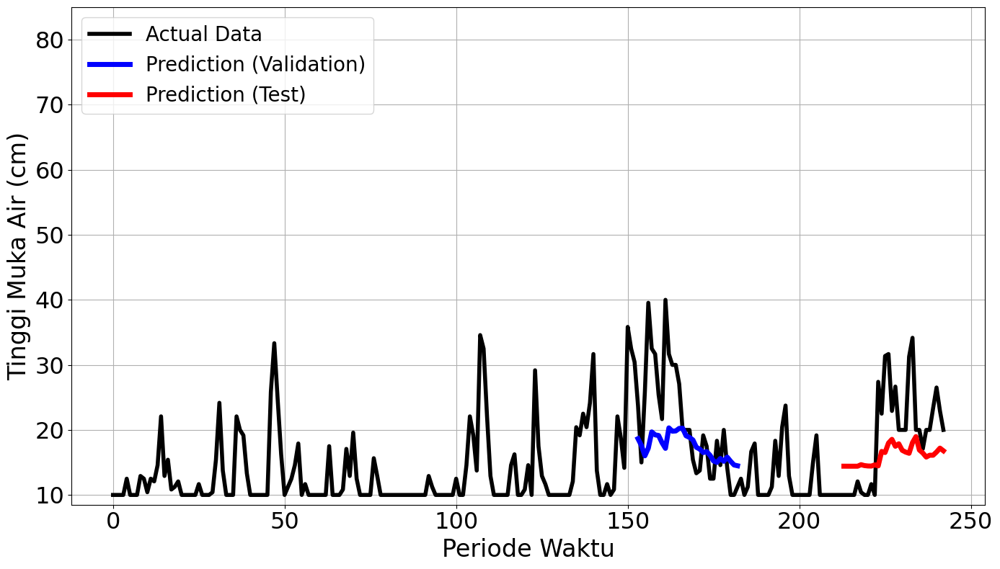

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.0692 - val_loss: 0.0480
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0245 - val_loss: 0.0394
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0204 - val_loss: 0.0416
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0108 - val_loss: 0.0254
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0116 - val_loss: 0.0270
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0127 - val_loss: 0.0226
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0111 - val_loss: 0.0361
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0107 - val_loss: 0.0258
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0114 - val_loss: 0.0211
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0128 - val_loss: 0.0246
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0135 - val_loss: 0.0232
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.

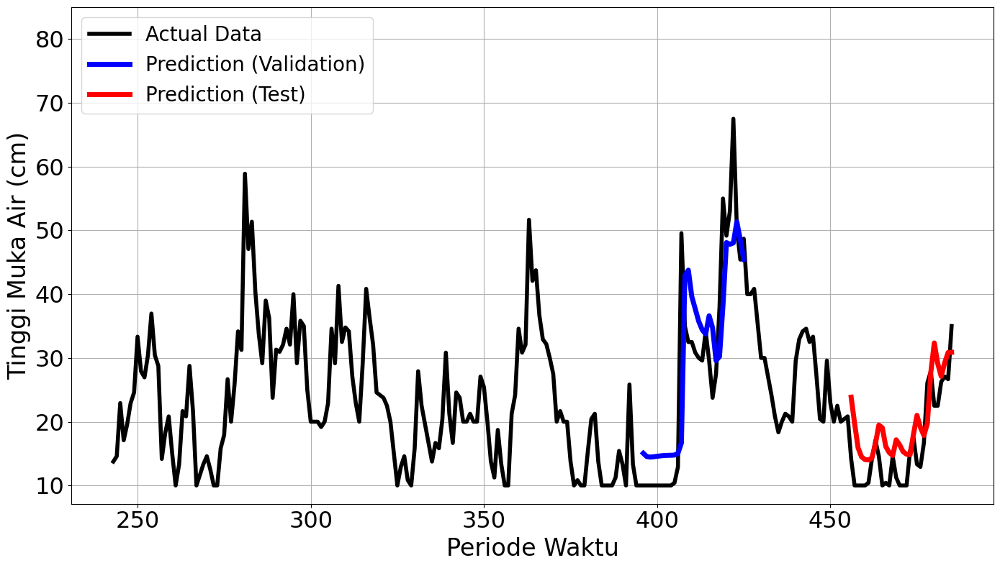

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 0.0600 - val_loss: 0.0028
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0026 - val_loss: 8.0125e-04
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0042 - val_loss: 4.3641e-04
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0027 - val_loss: 1.5772e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0053 - val_loss: 1.8390e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0014 - val_loss: 6.6625e-04
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0016 - val_loss: 1.9867e-04
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0031 - val_loss: 2.4749e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0037Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0036 - val_loss: 1.8579e-04
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s

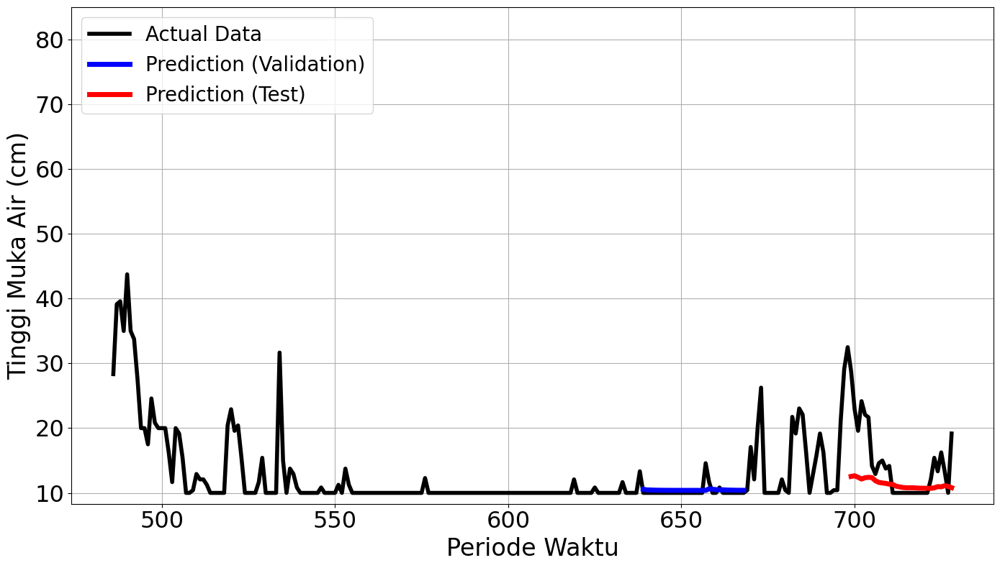

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0994 - val_loss: 0.0095
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0239 - val_loss: 0.0147
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0194 - val_loss: 0.0081
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0197 - val_loss: 0.0125
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0155 - val_loss: 0.0030
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0110 - val_loss: 0.0049
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0131 - val_loss: 0.0031
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0106 - val_loss: 0.0094
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - loss: 0.0119 - val_loss: 0.0071
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0112Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0112 - val_loss: 0.0034
Epoch 00010: early stopping
30/30 ━━━━━━━

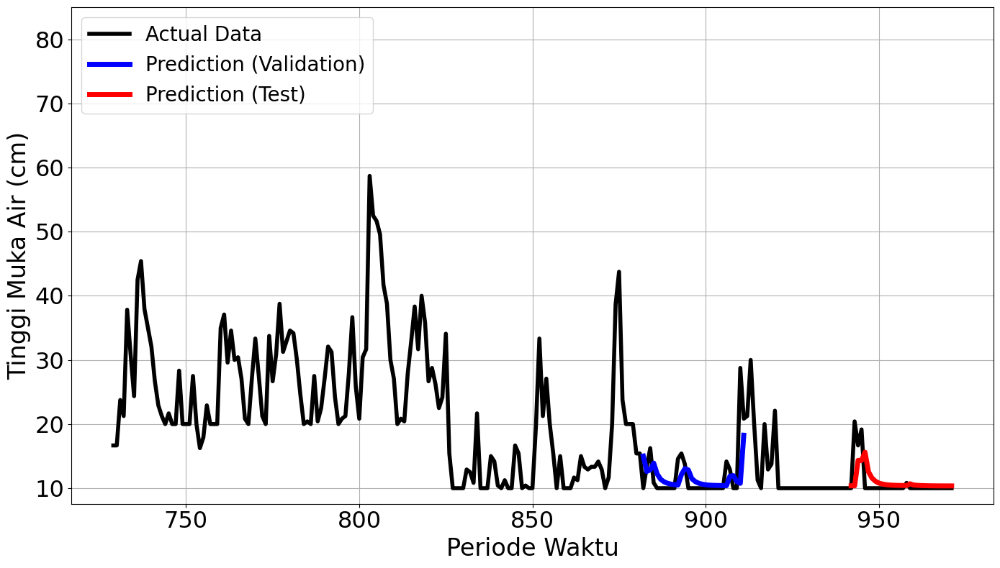

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1004 - val_loss: 0.0214
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0134 - val_loss: 0.0220
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0159 - val_loss: 0.0202
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - loss: 0.0091 - val_loss: 0.0223
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0099 - val_loss: 0.0209
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0101 - val_loss: 0.0203
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0083 - val_loss: 0.0204
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0082 - val_loss: 0.0191
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0061 - val_loss: 0.0206
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0096 - val_loss: 0.0174
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0109 - val_loss: 0.0214
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0

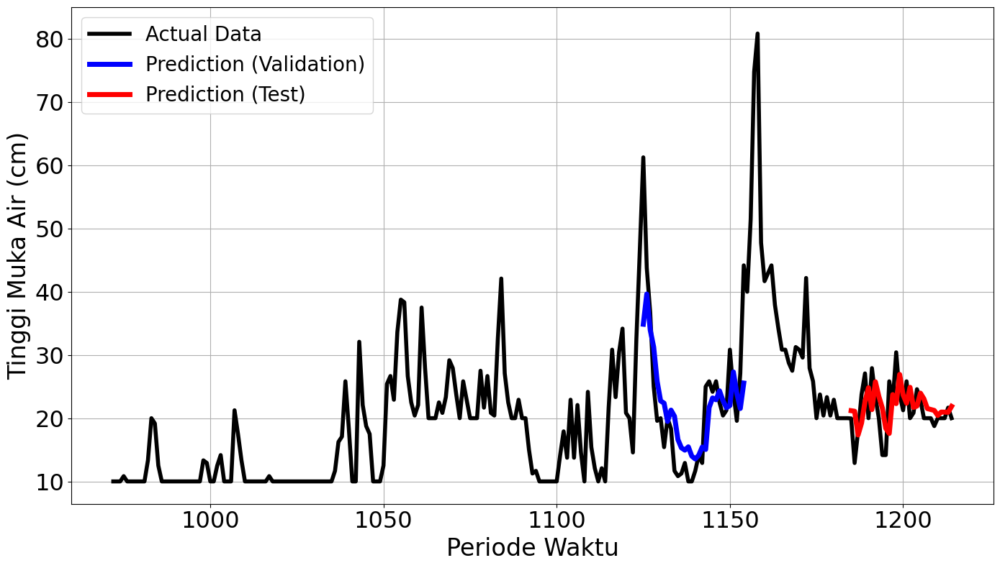

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1990
Final Average MAPE Test: 0.2261
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0632 - val_loss: 0.0228
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0078 - val_loss: 0.0158
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0048 - val_loss: 0.0137
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0077 - val_loss: 0.0198
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0063 - val_loss: 0.0141
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0065 - val_loss: 0.0221
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0035 - val_loss: 0.0198
Epoch 8/150
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0031Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0032 - val_loss: 0.0253
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
mape validation = 26.048629398261834 %
mape test = 30.851117327650417 %


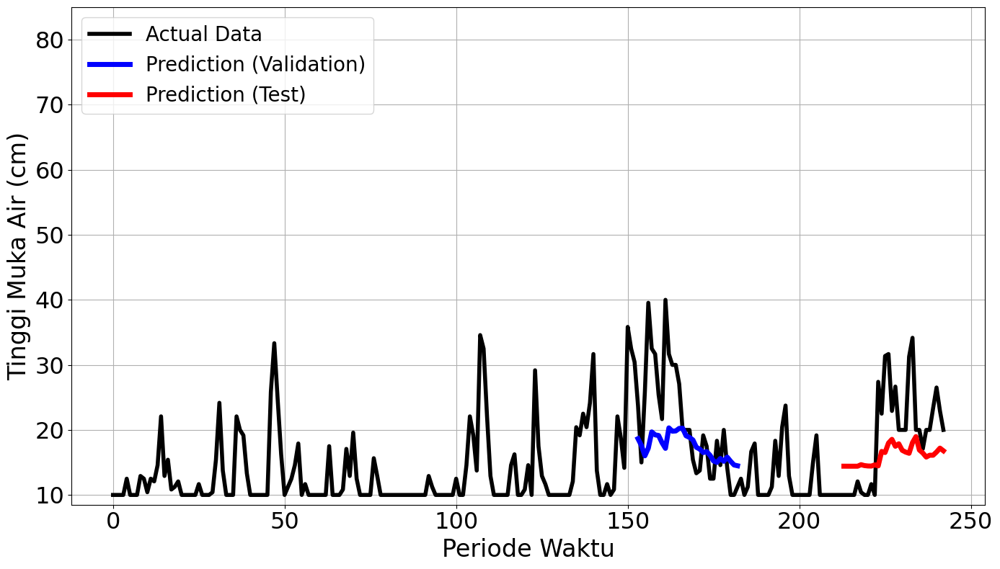

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.0692 - val_loss: 0.0480
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0245 - val_loss: 0.0394
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0204 - val_loss: 0.0416
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0108 - val_loss: 0.0254
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0116 - val_loss: 0.0270
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0127 - val_loss: 0.0226
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0111 - val_loss: 0.0361
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0107 - val_loss: 0.0258
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0114 - val_loss: 0.0211
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0128 - val_loss: 0.0246
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0135 - val_loss: 0.0232
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.0

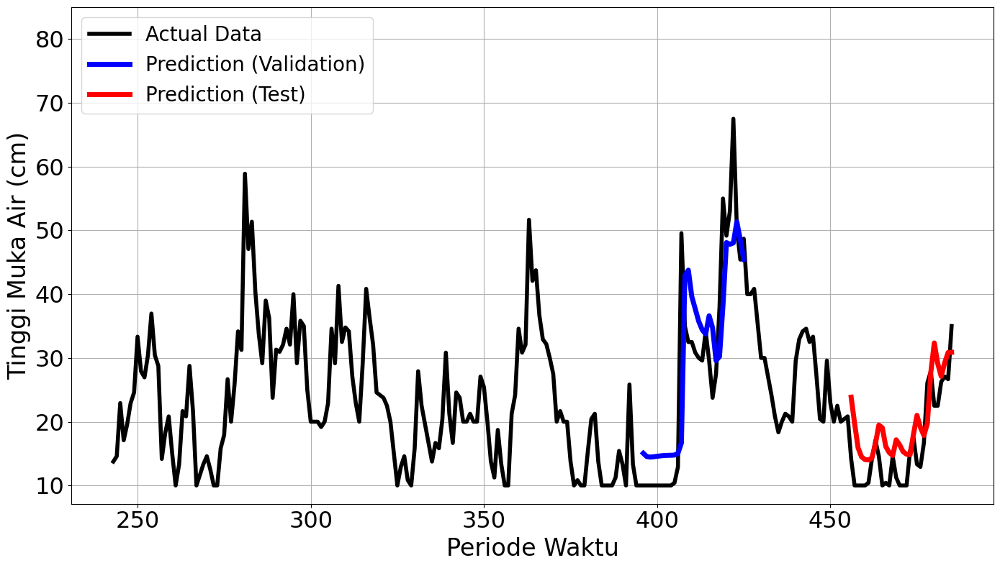

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.0600 - val_loss: 0.0028
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0026 - val_loss: 8.0125e-04
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0042 - val_loss: 4.3641e-04
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0027 - val_loss: 1.5772e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0053 - val_loss: 1.8390e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0014 - val_loss: 6.6625e-04
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0016 - val_loss: 1.9867e-04
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0031 - val_loss: 2.4749e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0037Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0036 - val_loss: 1.8579e-04
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s

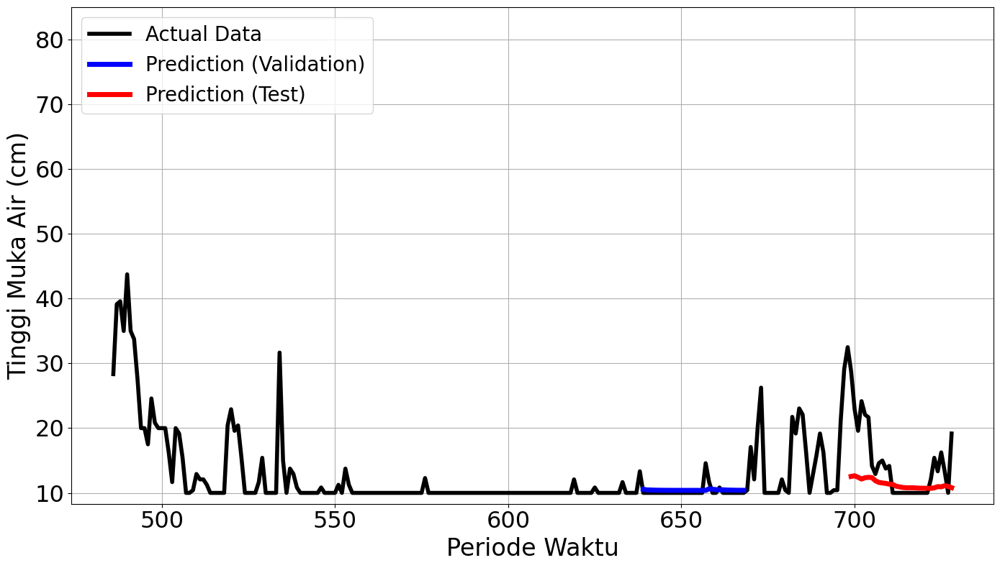

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0994 - val_loss: 0.0095
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0239 - val_loss: 0.0147
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0194 - val_loss: 0.0081
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0197 - val_loss: 0.0125
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0155 - val_loss: 0.0030
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0110 - val_loss: 0.0049
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0131 - val_loss: 0.0031
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0106 - val_loss: 0.0094
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0119 - val_loss: 0.0071
Epoch 10/150
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0112Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0112 - val_loss: 0.0034
Epoch 00010: early stopping
30/30 ━━━━━━━

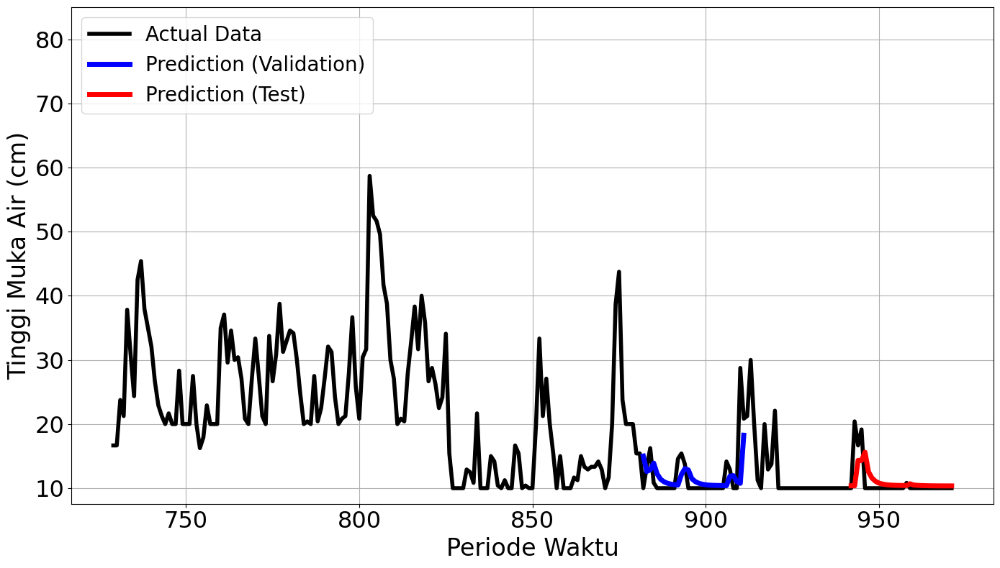

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1004 - val_loss: 0.0214
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0134 - val_loss: 0.0220
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0159 - val_loss: 0.0202
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0091 - val_loss: 0.0223
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0099 - val_loss: 0.0209
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0101 - val_loss: 0.0203
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0083 - val_loss: 0.0204
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0082 - val_loss: 0.0191
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0061 - val_loss: 0.0206
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0096 - val_loss: 0.0174
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0109 - val_loss: 0.0214
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0

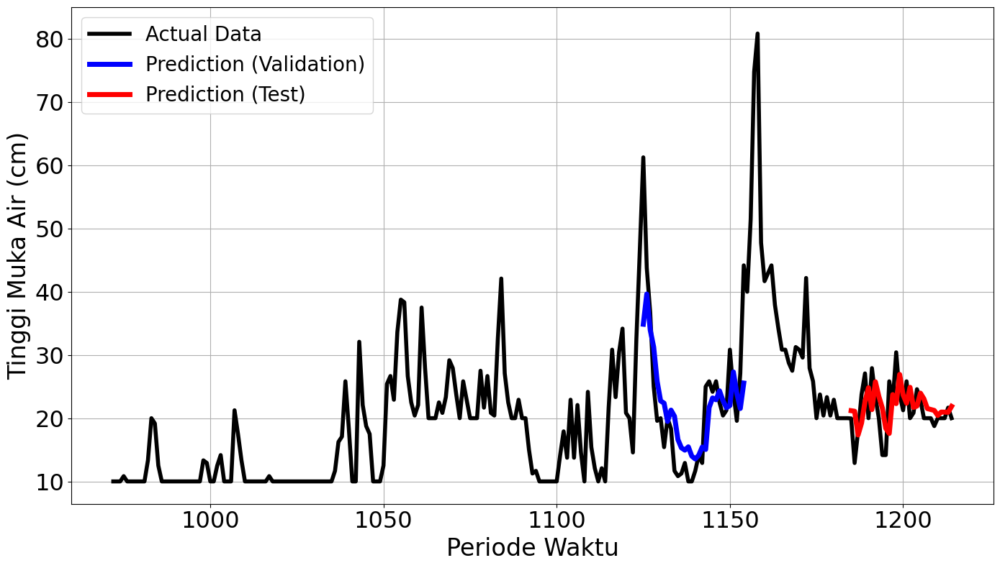

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1990
Final Average MAPE Test: 0.2261
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 198ms/step - loss: 0.1316 - val_loss: 0.0426
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0326 - val_loss: 0.0449
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0245 - val_loss: 0.0311
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0149 - val_loss: 0.0238
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0112 - val_loss: 0.0122
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0075 - val_loss: 0.0218
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0091 - val_loss: 0.0158
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0070 - val_loss: 0.0235
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0073 - val_loss: 0.0163
Epoch 10/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0056Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0059 - val_loss: 0.0264
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 489ms/

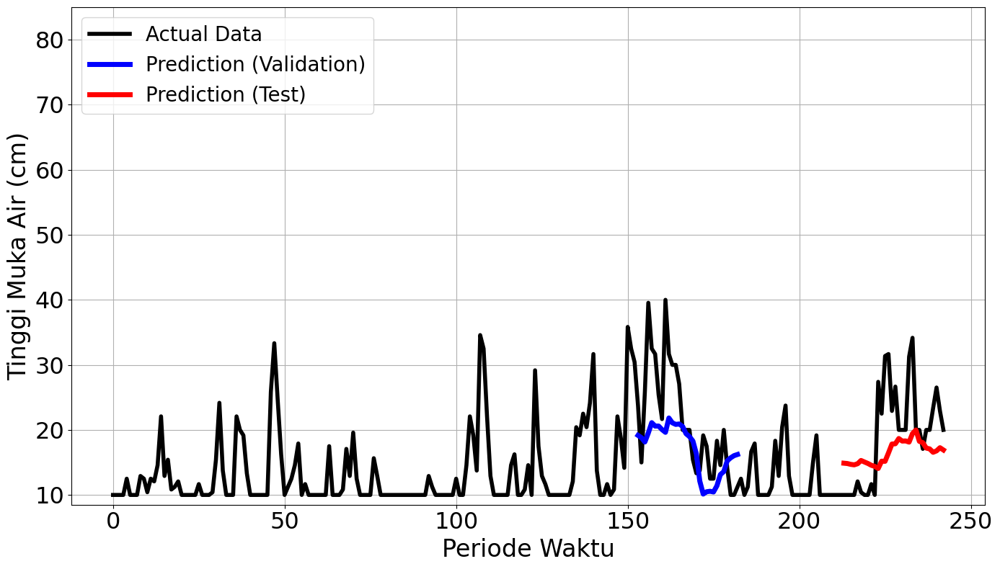

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 194ms/step - loss: 0.1053 - val_loss: 0.0381
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0599 - val_loss: 0.0635
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0368 - val_loss: 0.0427
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0341 - val_loss: 0.0337
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0225 - val_loss: 0.0385
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0246 - val_loss: 0.0350
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0176 - val_loss: 0.0307
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0189 - val_loss: 0.0352
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0170 - val_loss: 0.0310
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0147 - val_loss: 0.0276
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0189 - val_loss: 0.0268
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0130 - val_loss: 0.0236


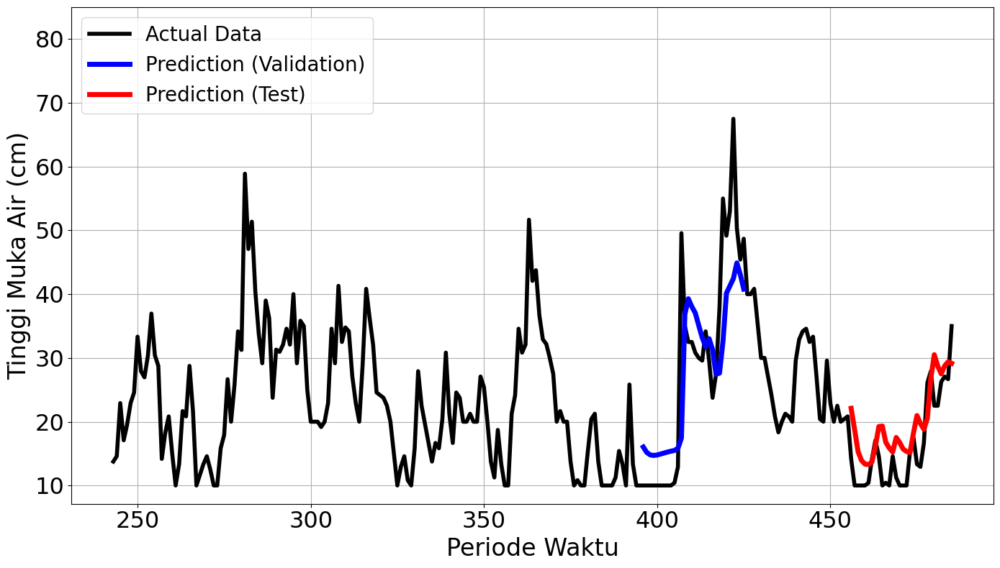

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 187ms/step - loss: 0.0713 - val_loss: 0.0093
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.1356 - val_loss: 0.0038
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0277 - val_loss: 0.0052
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0204 - val_loss: 0.0023
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0121 - val_loss: 6.2592e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0065 - val_loss: 0.0018
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0035 - val_loss: 0.0024
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0055 - val_loss: 0.0010
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0038 - val_loss: 4.1172e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0036 - val_loss: 3.8245e-04
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0037 - val_loss: 7.7426e-04
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0031 - v

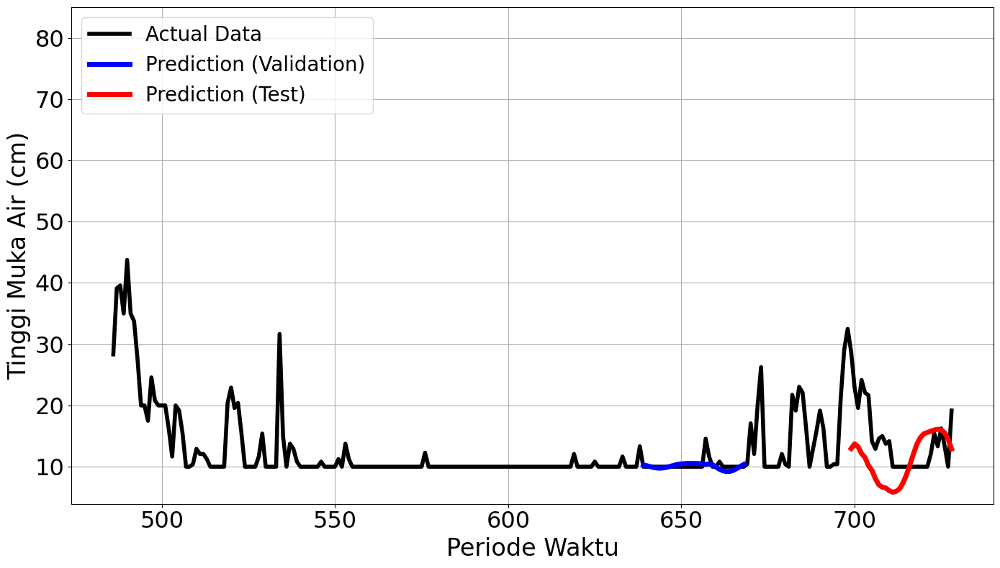

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 201ms/step - loss: 0.1711 - val_loss: 0.1178
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0607 - val_loss: 0.0523
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0407 - val_loss: 0.0117
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0340 - val_loss: 0.0038
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0450 - val_loss: 0.0030
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0146 - val_loss: 0.0036
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0181 - val_loss: 0.0062
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0253 - val_loss: 0.0120
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0154 - val_loss: 0.0030
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0235 - val_loss: 0.0035
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0170 - val_loss: 0.0046
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0185 - val_loss: 0.0036


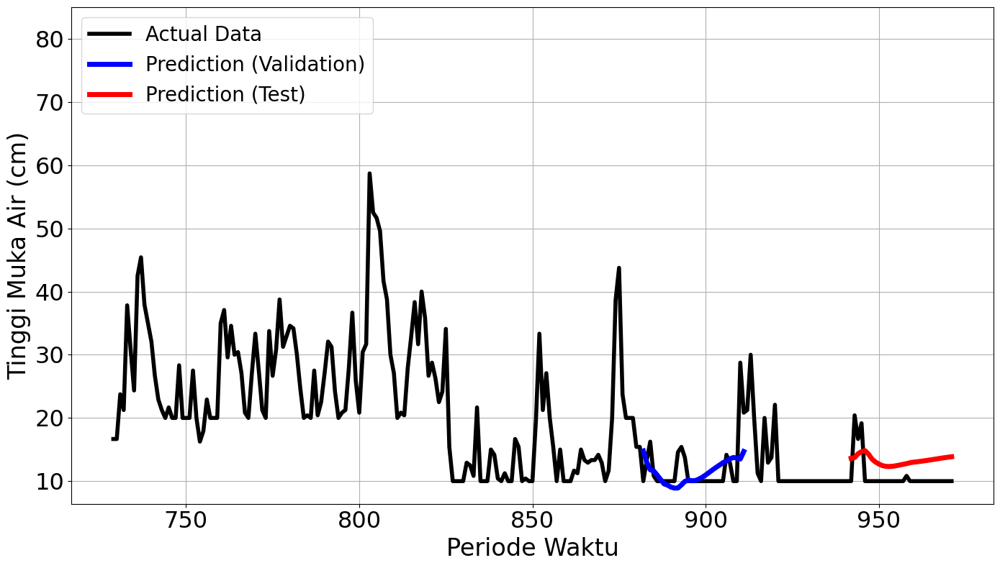

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - loss: 0.1454 - val_loss: 0.0362
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0648 - val_loss: 0.0269
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0335 - val_loss: 0.0258
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0291 - val_loss: 0.0258
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0297 - val_loss: 0.0262
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0206 - val_loss: 0.0279
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0188 - val_loss: 0.0296
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0134 - val_loss: 0.0269
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0141 - val_loss: 0.0258
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0141 - val_loss: 0.0231
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0103 - val_loss: 0.0230
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0087 - val_loss: 0.0224


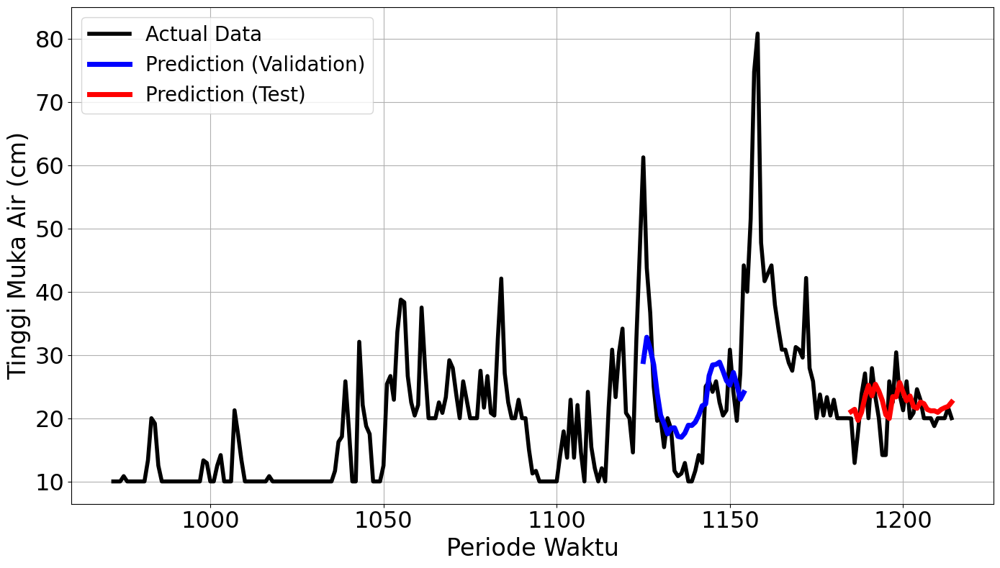

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2261
Final Average MAPE Test: 0.2967
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 178ms/step - loss: 0.1316 - val_loss: 0.0426
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0326 - val_loss: 0.0449
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0245 - val_loss: 0.0311
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0149 - val_loss: 0.0238
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0112 - val_loss: 0.0122
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0075 - val_loss: 0.0218
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - val_loss: 0.0158
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0070 - val_loss: 0.0235
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0073 - val_loss: 0.0163
Epoch 10/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0056Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0059 - val_loss: 0.0264
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 433ms/

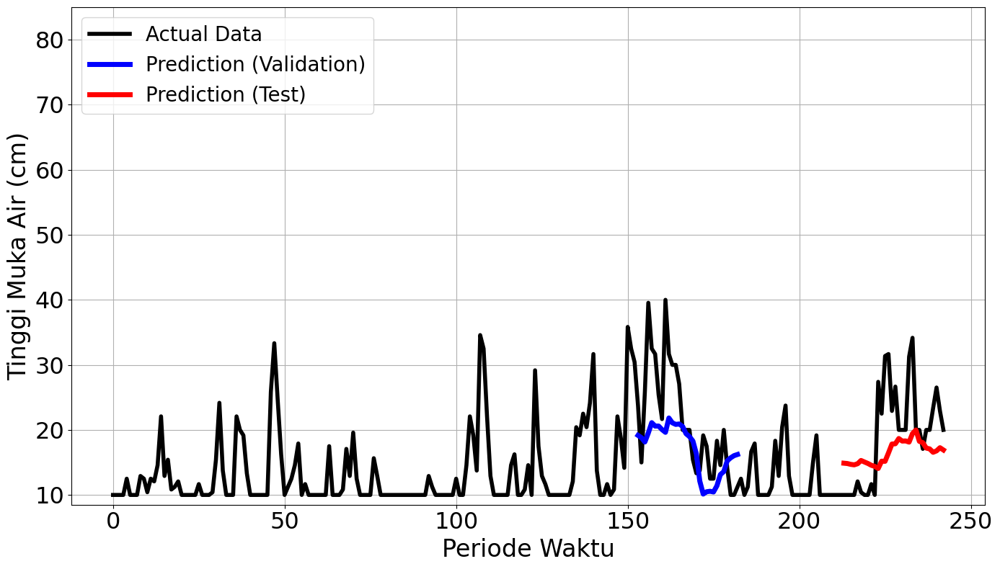

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - loss: 0.1053 - val_loss: 0.0381
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0599 - val_loss: 0.0635
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0368 - val_loss: 0.0427
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0341 - val_loss: 0.0337
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0225 - val_loss: 0.0385
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0246 - val_loss: 0.0350
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0176 - val_loss: 0.0307
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0189 - val_loss: 0.0352
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0170 - val_loss: 0.0310
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0147 - val_loss: 0.0276
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0189 - val_loss: 0.0268
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0130 - val_loss: 0.0236


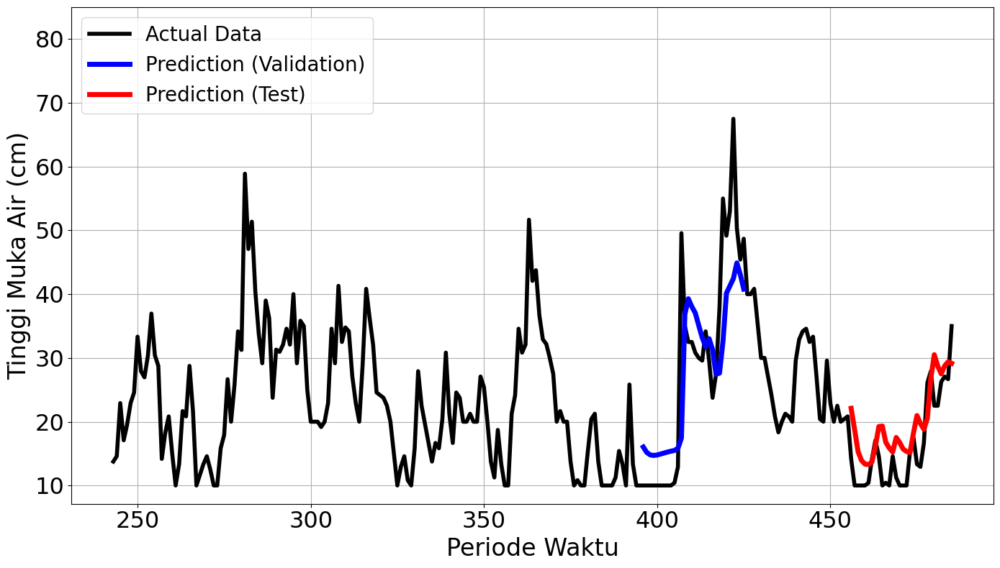

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 189ms/step - loss: 0.0713 - val_loss: 0.0093
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.1356 - val_loss: 0.0038
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0277 - val_loss: 0.0052
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0204 - val_loss: 0.0023
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0121 - val_loss: 6.2592e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0065 - val_loss: 0.0018
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0035 - val_loss: 0.0024
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0055 - val_loss: 0.0010
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0038 - val_loss: 4.1172e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0036 - val_loss: 3.8245e-04
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0037 - val_loss: 7.7426e-04
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0031 - v

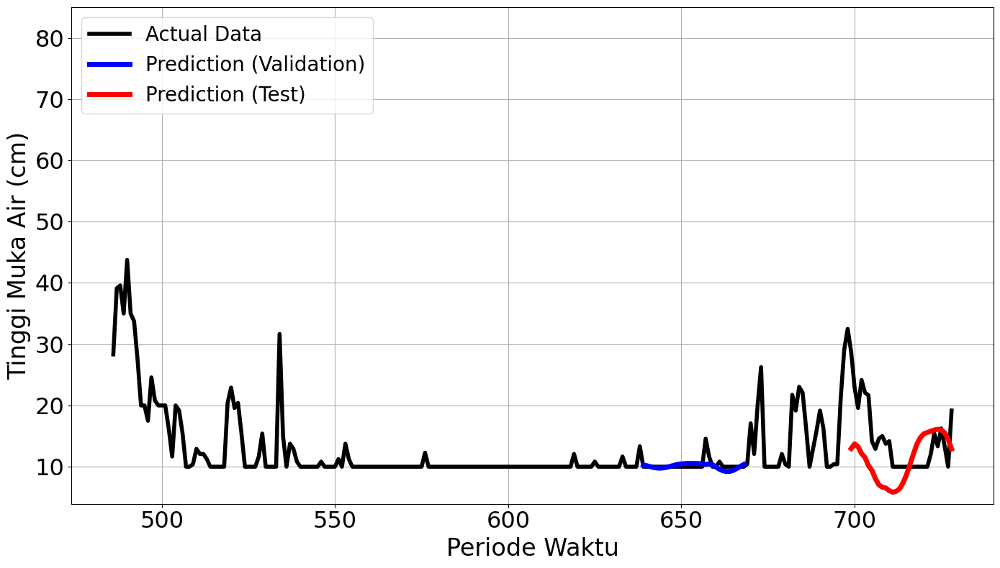

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 183ms/step - loss: 0.1711 - val_loss: 0.1178
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0607 - val_loss: 0.0523
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0407 - val_loss: 0.0117
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0340 - val_loss: 0.0038
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0450 - val_loss: 0.0030
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0146 - val_loss: 0.0036
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0181 - val_loss: 0.0062
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0253 - val_loss: 0.0120
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0154 - val_loss: 0.0030
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0235 - val_loss: 0.0035
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0170 - val_loss: 0.0046
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0185 - val_loss: 0.0036


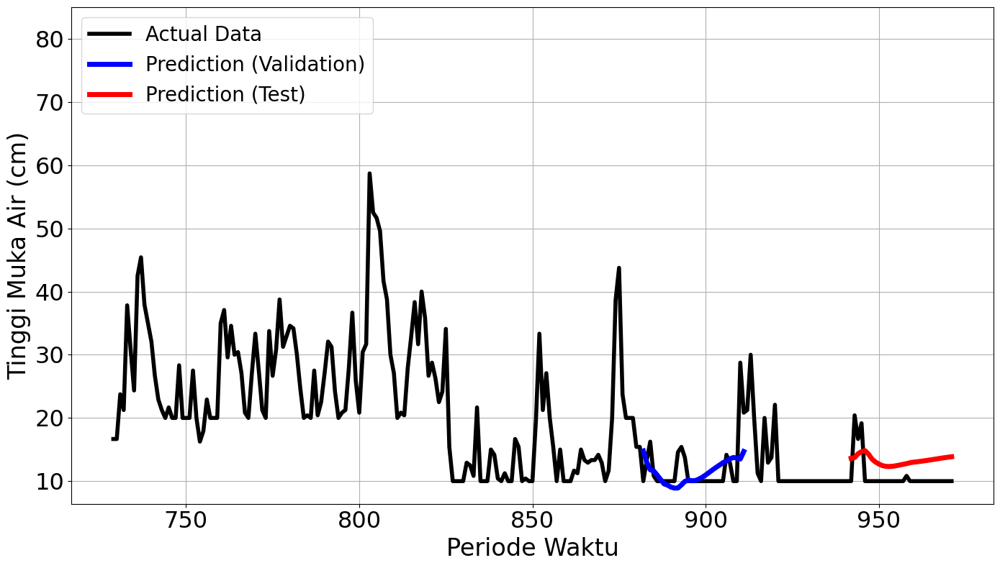

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 186ms/step - loss: 0.1454 - val_loss: 0.0362
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0648 - val_loss: 0.0269
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0335 - val_loss: 0.0258
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0291 - val_loss: 0.0258
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0297 - val_loss: 0.0262
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0206 - val_loss: 0.0279
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0188 - val_loss: 0.0296
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0134 - val_loss: 0.0269
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0141 - val_loss: 0.0258
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0141 - val_loss: 0.0231
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0103 - val_loss: 0.0230
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0087 - val_loss: 0.0224


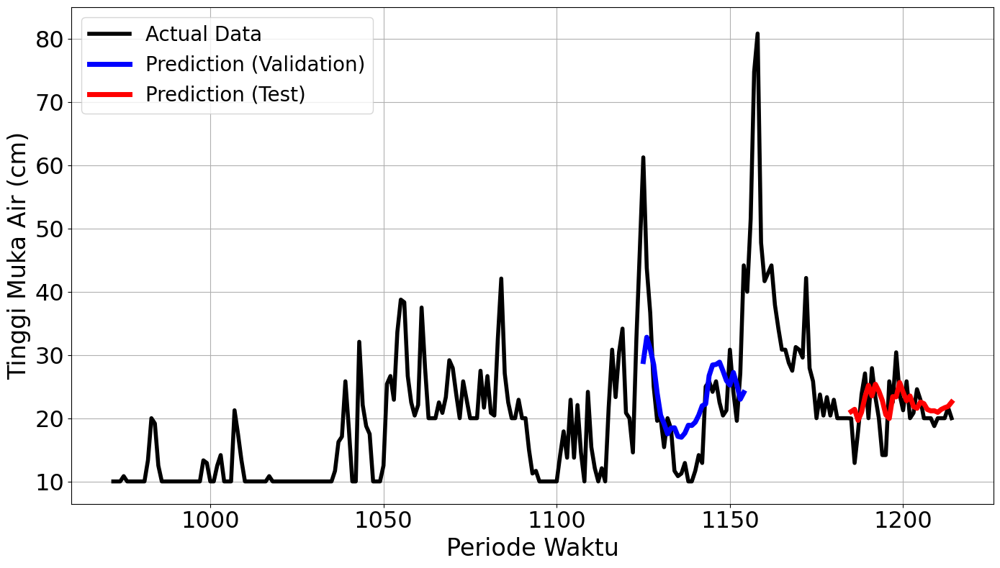

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2261
Final Average MAPE Test: 0.2967
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 888ms/step - loss: 0.2244 - val_loss: 0.1450
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.0433 - val_loss: 0.0800
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - loss: 0.0281 - val_loss: 0.0450
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 170ms/step - loss: 0.0208 - val_loss: 0.0447
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0169 - val_loss: 0.0495
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - loss: 0.0217 - val_loss: 0.0433
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0142 - val_loss: 0.0467
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0133 - val_loss: 0.0471
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0167 - val_loss: 0.0276
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0090 - val_loss: 0.0172
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0088 - val_loss: 0.0150
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0093 - val_lo

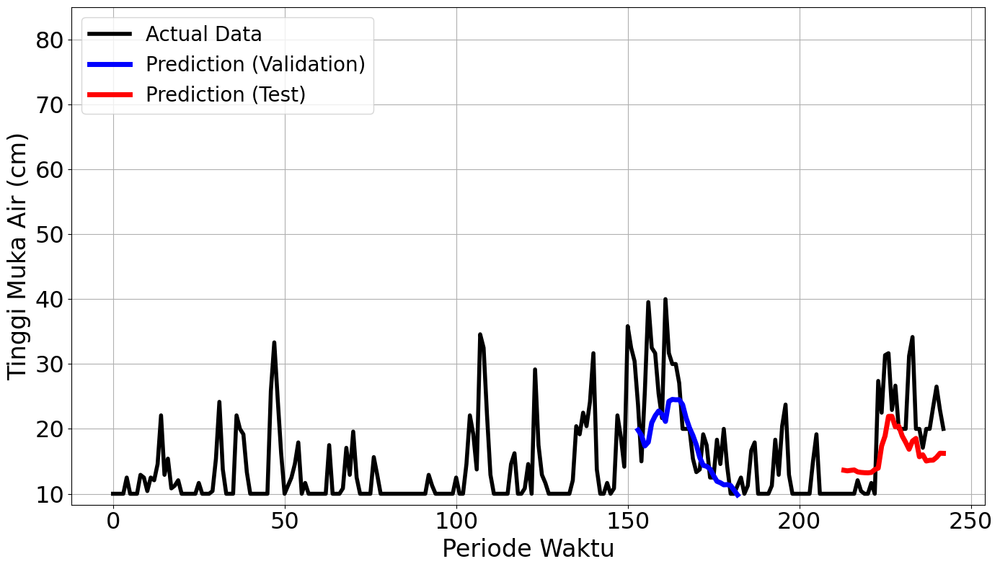

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 733ms/step - loss: 0.0795 - val_loss: 0.0702
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0978 - val_loss: 0.0407
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0598 - val_loss: 0.0684
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0813 - val_loss: 0.0625
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.0747 - val_loss: 0.0402
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - loss: 0.0479 - val_loss: 0.0328
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0369 - val_loss: 0.0361
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0231 - val_loss: 0.0363
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0355 - val_loss: 0.0330
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0323 - val_loss: 0.0330
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0230 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step 

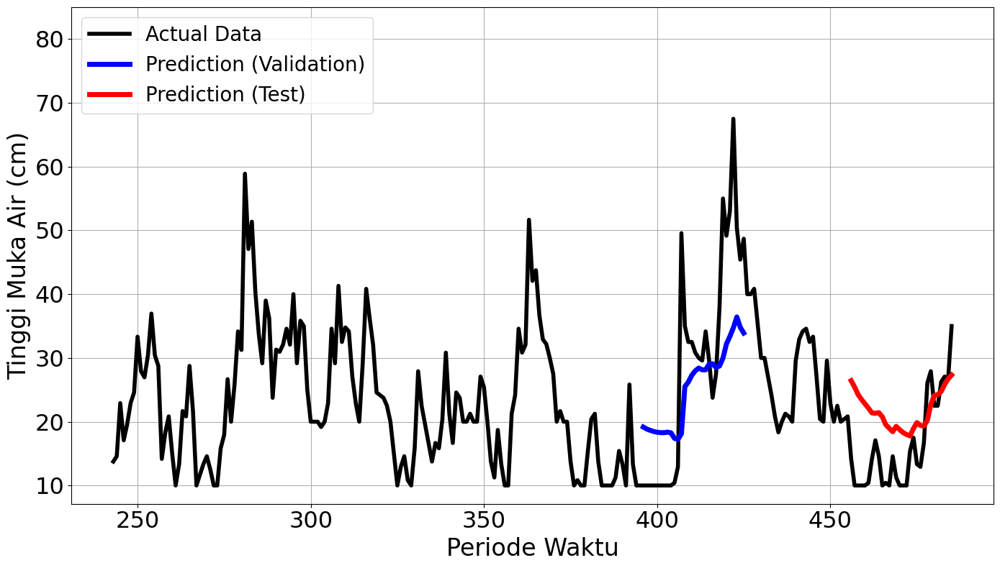

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 742ms/step - loss: 0.2236 - val_loss: 0.0102
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1111 - val_loss: 0.0501
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0607 - val_loss: 1.9149e-04
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0111 - val_loss: 6.3152e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0156 - val_loss: 7.7034e-04
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0201 - val_loss: 0.0029
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0144 - val_loss: 5.1892e-04
Epoch 8/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0101Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0109 - val_loss: 0.0033
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
mape validation = 6.353448148158745 %
mape test = 37.096202896317045 %


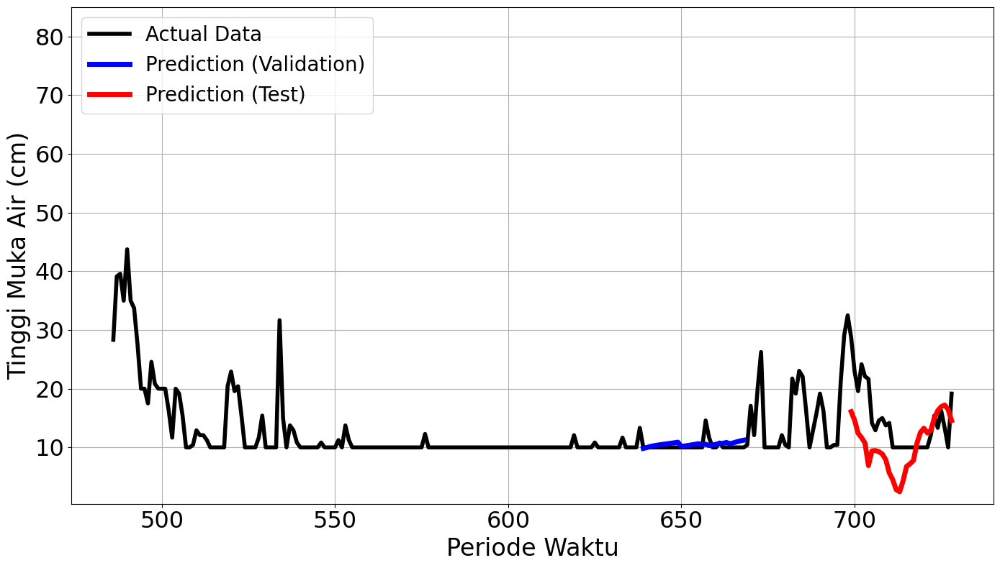

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 579ms/step - loss: 0.1889 - val_loss: 0.3089
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.2053 - val_loss: 0.0142
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0409 - val_loss: 0.0225
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0711 - val_loss: 0.0119
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0489 - val_loss: 0.0057
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0407 - val_loss: 0.0071
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0383 - val_loss: 0.0102
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0485 - val_loss: 0.0043
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0397 - val_loss: 0.0052
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0400 - val_loss: 0.0046
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0235 - val_loss: 0.0050
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0292 - val_lo

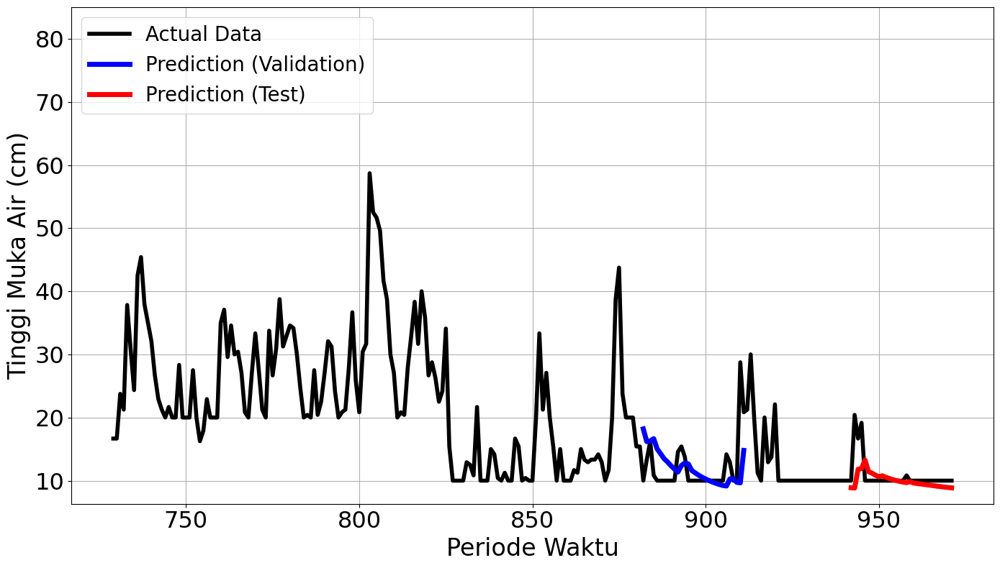

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 591ms/step - loss: 0.1420 - val_loss: 0.0537
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0848 - val_loss: 0.1026
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0559 - val_loss: 0.0406
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0353 - val_loss: 0.0435
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.0347 - val_loss: 0.0354
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0270 - val_loss: 0.0280
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0159 - val_loss: 0.0281
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0169 - val_loss: 0.0280
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0252 - val_loss: 0.0296
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0187 - val_loss: 0.0300
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0146 - val_loss: 0.0271
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0235 - val_lo

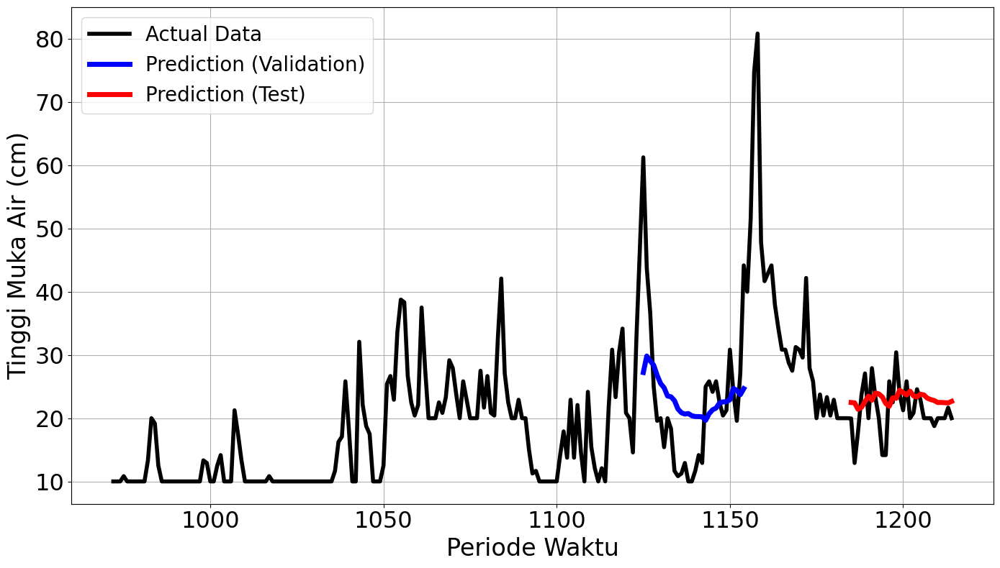

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2674
Final Average MAPE Test: 0.3015
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 948ms/step - loss: 0.2244 - val_loss: 0.1450
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0433 - val_loss: 0.0800
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0281 - val_loss: 0.0450
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0208 - val_loss: 0.0447
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0169 - val_loss: 0.0495
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0217 - val_loss: 0.0433
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0142 - val_loss: 0.0467
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0133 - val_loss: 0.0471
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0167 - val_loss: 0.0276
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0090 - val_loss: 0.0172
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0088 - val_loss: 0.0150
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0093 - val_lo

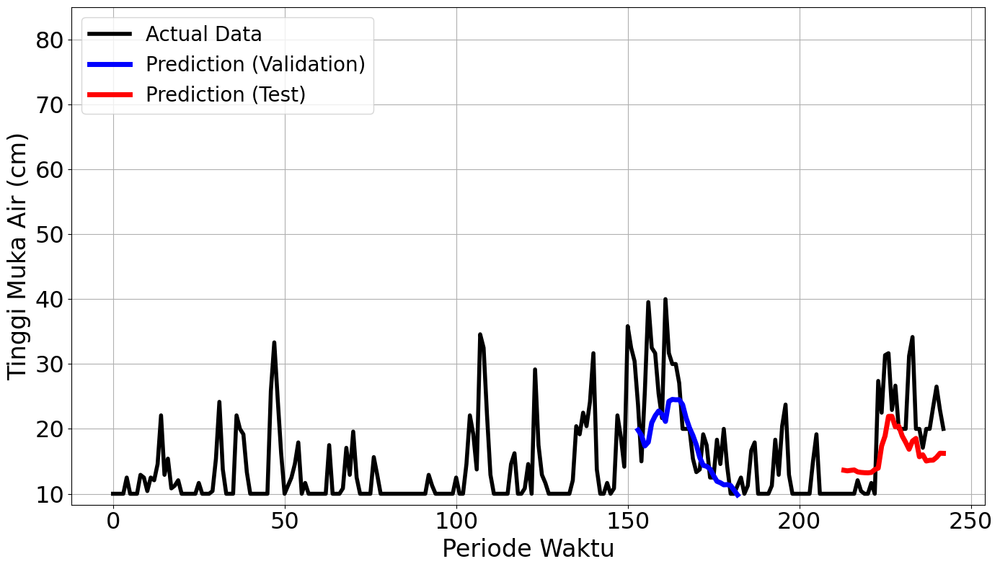

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 793ms/step - loss: 0.0795 - val_loss: 0.0702
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - loss: 0.0978 - val_loss: 0.0407
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0598 - val_loss: 0.0684
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0813 - val_loss: 0.0625
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - loss: 0.0747 - val_loss: 0.0402
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0479 - val_loss: 0.0328
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0369 - val_loss: 0.0361
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0231 - val_loss: 0.0363
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0355 - val_loss: 0.0330
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0323 - val_loss: 0.0330
Epoch 11/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0242Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step 

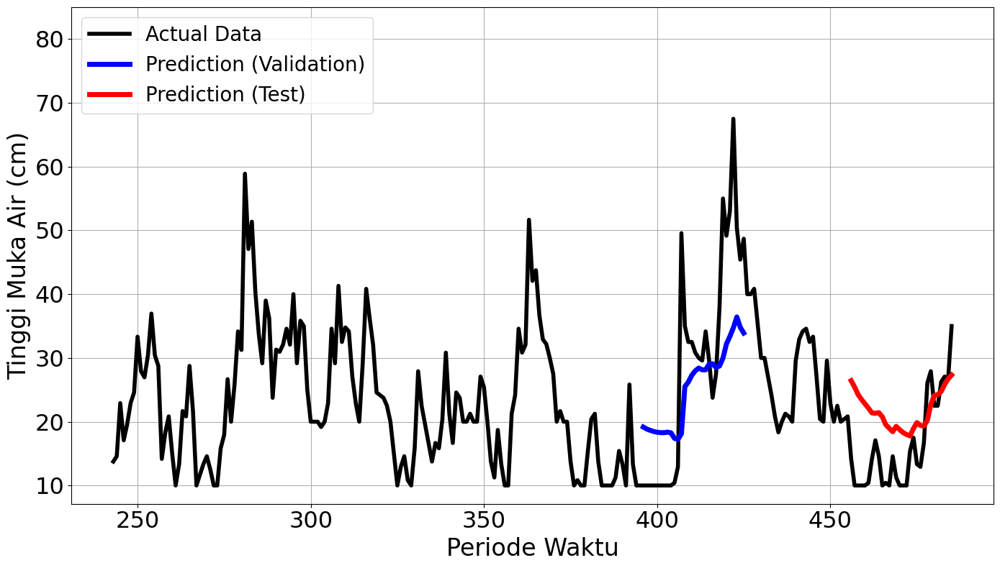

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 563ms/step - loss: 0.2236 - val_loss: 0.0102
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.1111 - val_loss: 0.0501
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0607 - val_loss: 1.9149e-04
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0111 - val_loss: 6.3152e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0156 - val_loss: 7.7034e-04
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0201 - val_loss: 0.0029
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0144 - val_loss: 5.1892e-04
Epoch 8/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.0101Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0109 - val_loss: 0.0033
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
mape validation = 6.353448148158745 %
mape test = 37.096202896317045 %


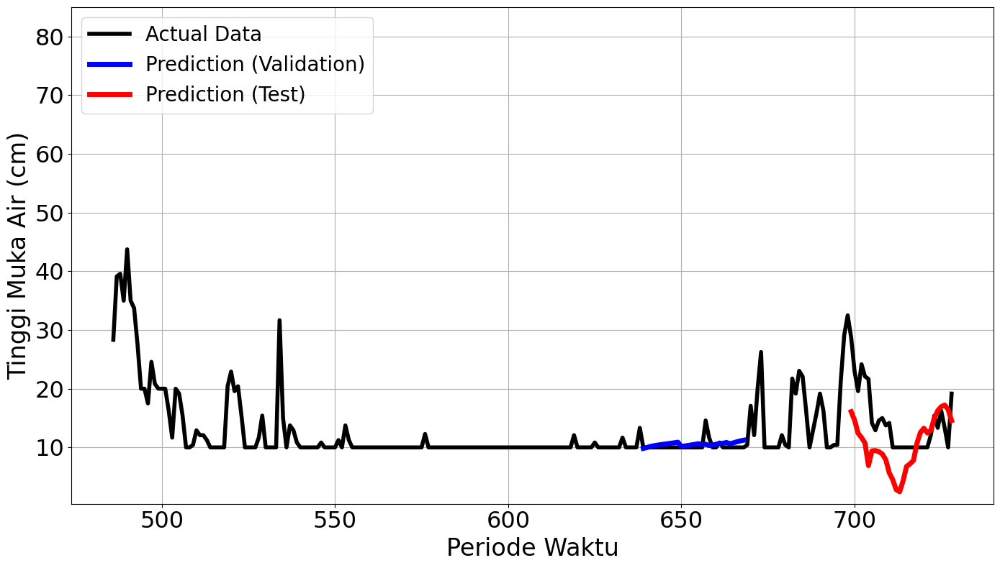

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 551ms/step - loss: 0.1889 - val_loss: 0.3089
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.2053 - val_loss: 0.0142
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0409 - val_loss: 0.0225
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0711 - val_loss: 0.0119
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0489 - val_loss: 0.0057
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0407 - val_loss: 0.0071
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0383 - val_loss: 0.0102
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0485 - val_loss: 0.0043
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0397 - val_loss: 0.0052
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0400 - val_loss: 0.0046
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0235 - val_loss: 0.0050
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0292 - val_lo

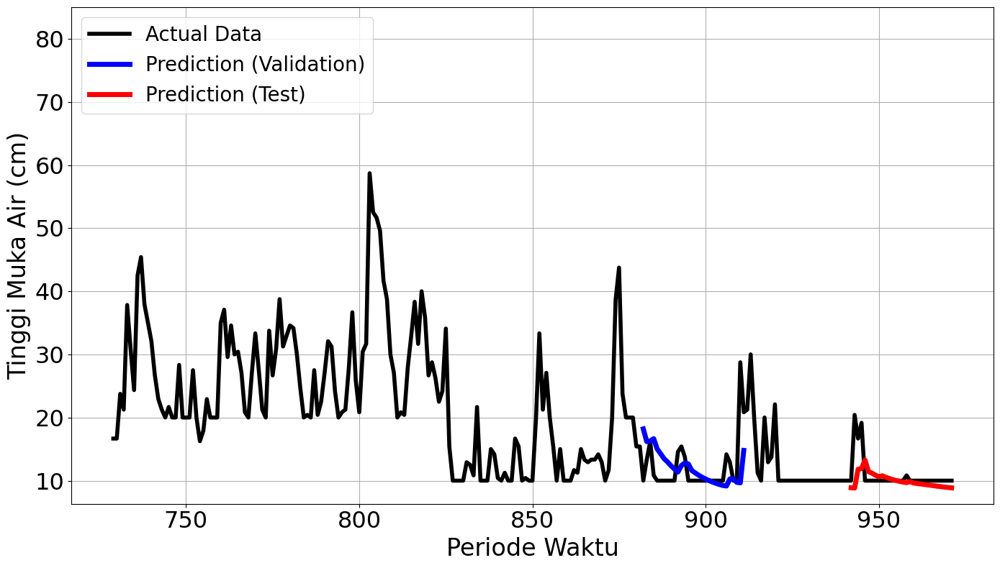

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 884ms/step - loss: 0.1420 - val_loss: 0.0537
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.0848 - val_loss: 0.1026
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.0559 - val_loss: 0.0406
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0353 - val_loss: 0.0435
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - loss: 0.0347 - val_loss: 0.0354
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0270 - val_loss: 0.0280
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0159 - val_loss: 0.0281
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0169 - val_loss: 0.0280
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0252 - val_loss: 0.0296
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0187 - val_loss: 0.0300
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0146 - val_loss: 0.0271
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0235 - val_lo

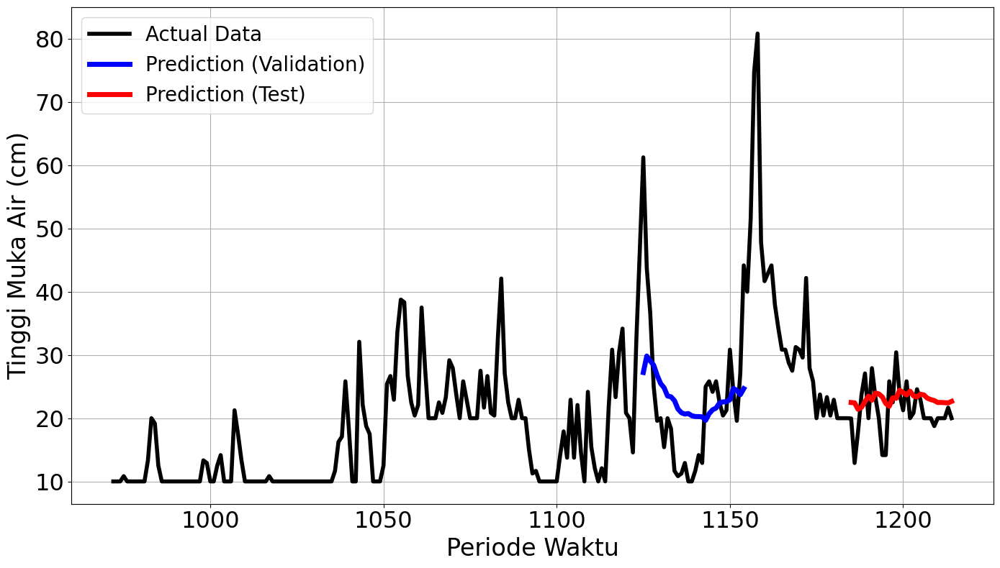

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2674
Final Average MAPE Test: 0.3015
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.2074 - val_loss: 0.1965
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step - loss: 0.0629 - val_loss: 0.1504
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step - loss: 0.0359 - val_loss: 0.0891
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - loss: 0.0371 - val_loss: 0.0655
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step - loss: 0.0283 - val_loss: 0.0614
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - loss: 0.0222 - val_loss: 0.0664
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step - loss: 0.0208 - val_loss: 0.0726
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - loss: 0.0180 - val_loss: 0.0764
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0224 - val_loss: 0.0729
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0146Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0146 - val_loss: 0.0628
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

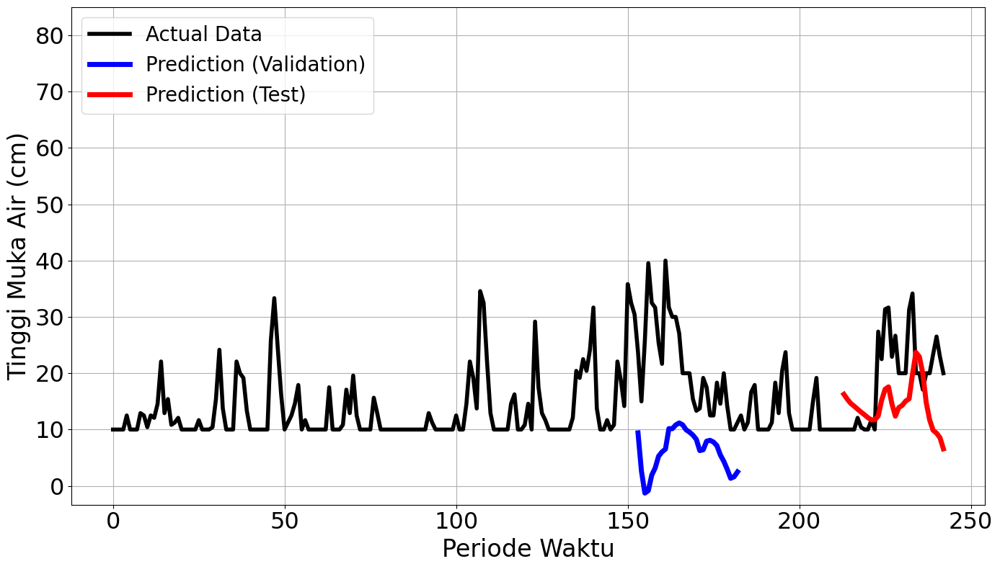

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.0898 - val_loss: 0.2352
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - loss: 0.1703 - val_loss: 0.0725
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step - loss: 0.1020 - val_loss: 0.0507
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0728 - val_loss: 0.0519
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0588 - val_loss: 0.0528
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0464 - val_loss: 0.0556
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0506 - val_loss: 0.0602
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0493Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.0493 - val_loss: 0.0654
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
mape validation = 85.94036054852552 %
mape test = 67.75312622013516 %


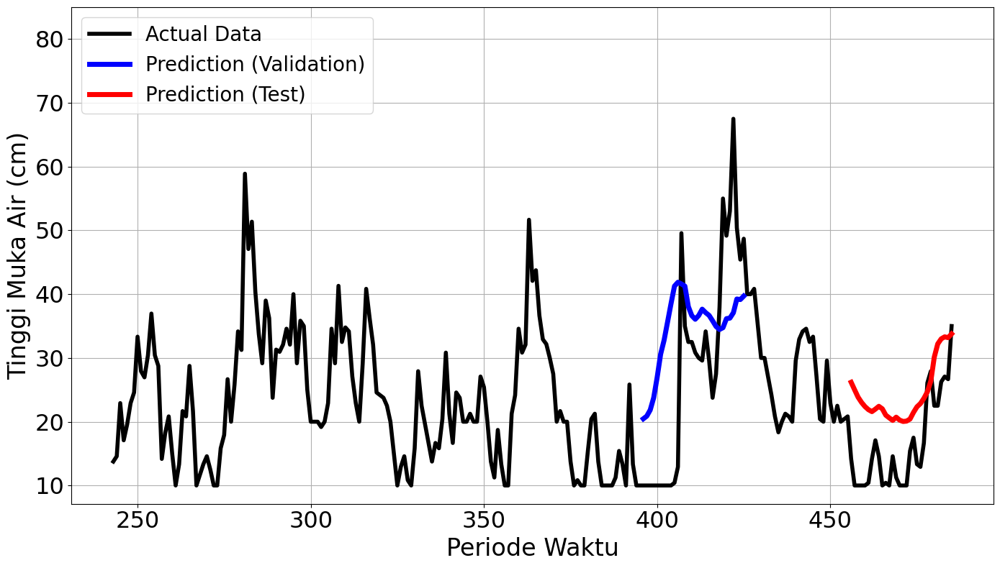

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.1820 - val_loss: 0.0545
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0889 - val_loss: 0.0054
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0283 - val_loss: 0.0285
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step - loss: 0.0486 - val_loss: 0.0078
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0279 - val_loss: 8.0614e-04
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - loss: 0.0225 - val_loss: 1.7927e-04
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step - loss: 0.0281 - val_loss: 2.1268e-04
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - loss: 0.0236 - val_loss: 6.2467e-04
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step - loss: 0.0368 - val_loss: 0.0084
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step - loss: 0.0208 - val_loss: 0.0081
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 0.0231Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0

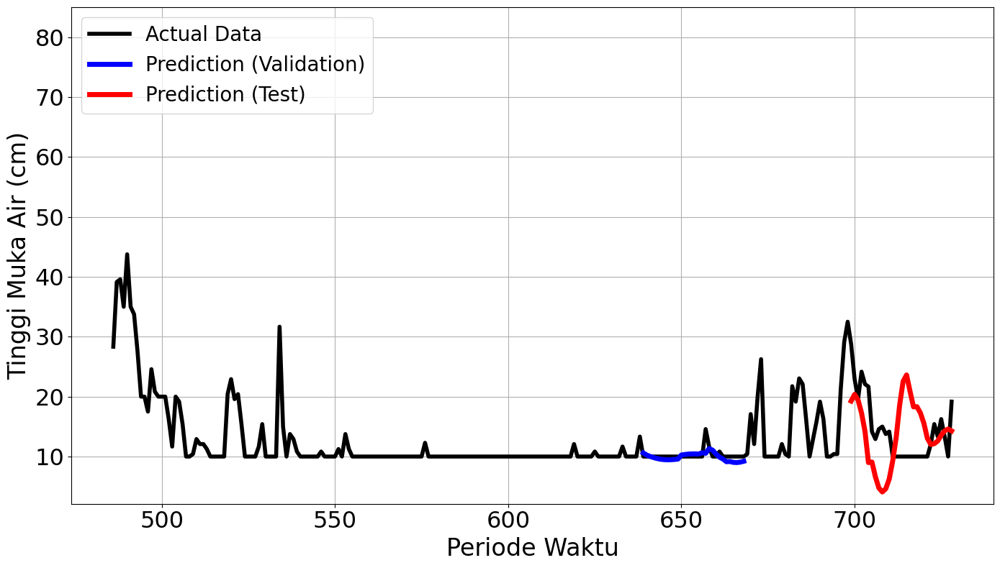

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1535 - val_loss: 0.2126
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.1650 - val_loss: 0.1040
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0837 - val_loss: 0.0086
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step - loss: 0.0724 - val_loss: 0.0050
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - loss: 0.0561 - val_loss: 0.0068
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step - loss: 0.0495 - val_loss: 0.0074
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step - loss: 0.0435 - val_loss: 0.0075
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.0583 - val_loss: 0.0096
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - loss: 0.0441Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - loss: 0.0441 - val_loss: 0.0076
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
mape validation = 34.06841200750701

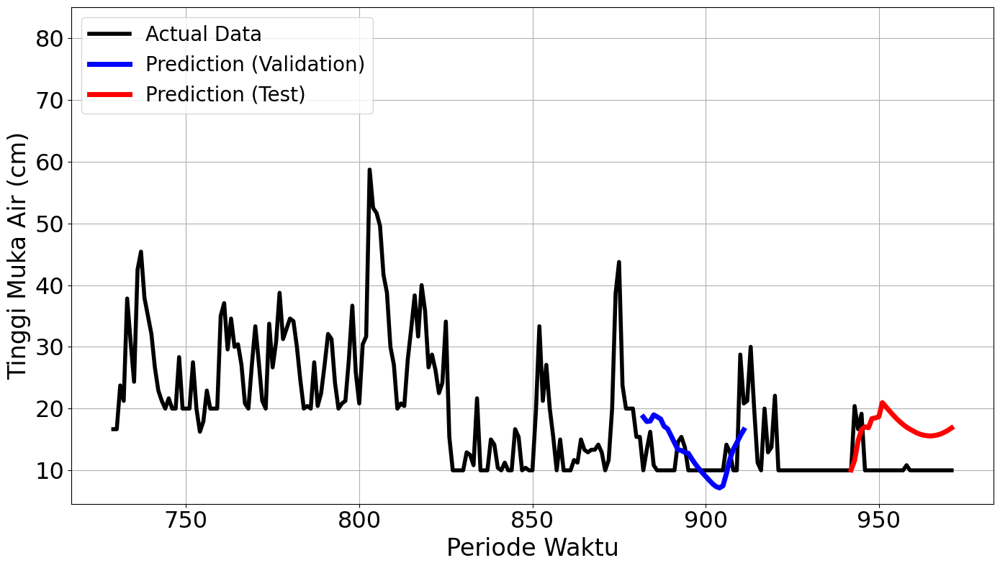

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.1596 - val_loss: 0.0594
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0566 - val_loss: 0.0398
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0384 - val_loss: 0.0289
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0337 - val_loss: 0.0283
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - loss: 0.0294 - val_loss: 0.0264
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0359 - val_loss: 0.0267
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0271 - val_loss: 0.0355
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0213 - val_loss: 0.0377
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0220 - val_loss: 0.0385
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 0.0292Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step - loss: 0.0292 - val_loss: 0.0286
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

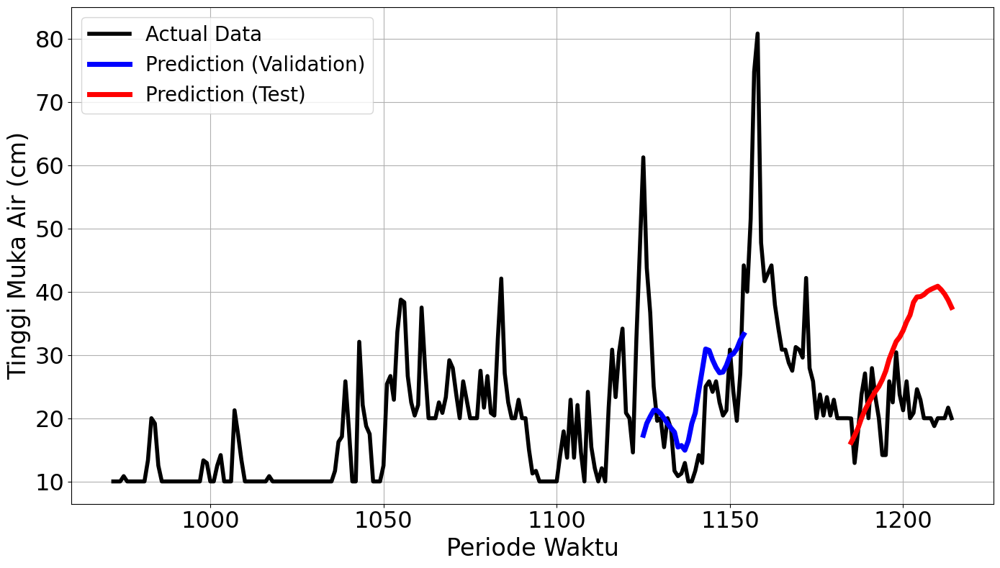

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4607
Final Average MAPE Test: 0.5503
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.2074 - val_loss: 0.1965
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0629 - val_loss: 0.1504
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step - loss: 0.0359 - val_loss: 0.0891
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - loss: 0.0371 - val_loss: 0.0655
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - loss: 0.0283 - val_loss: 0.0614
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0222 - val_loss: 0.0664
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0208 - val_loss: 0.0726
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - loss: 0.0180 - val_loss: 0.0764
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0224 - val_loss: 0.0729
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0146Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0146 - val_loss: 0.0628
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

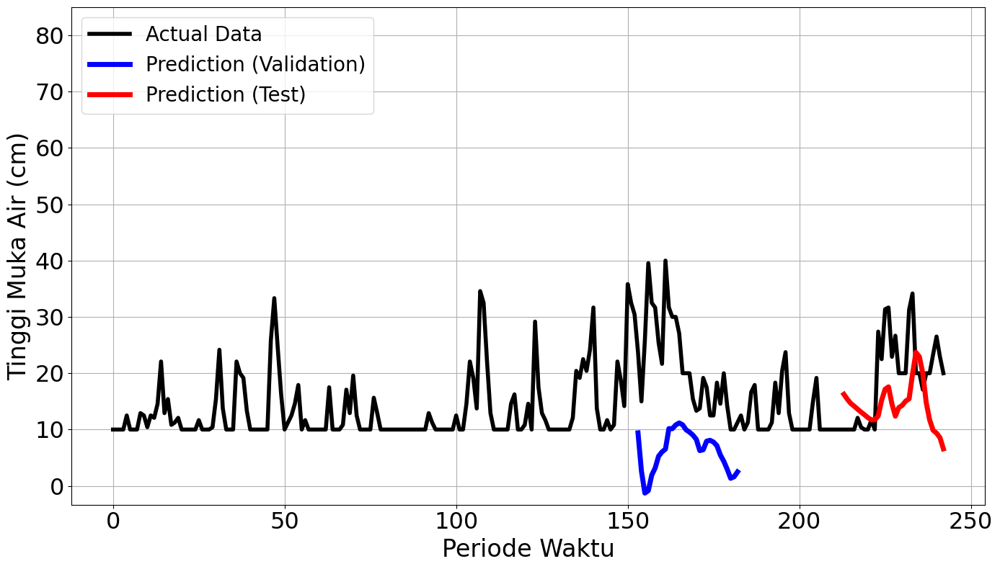

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - loss: 0.0898 - val_loss: 0.2352
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1703 - val_loss: 0.0725
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - loss: 0.1020 - val_loss: 0.0507
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - loss: 0.0728 - val_loss: 0.0519
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - loss: 0.0588 - val_loss: 0.0528
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0464 - val_loss: 0.0556
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - loss: 0.0506 - val_loss: 0.0602
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.0493Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step - loss: 0.0493 - val_loss: 0.0654
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
mape validation = 85.94036054852552 %
mape test = 67.75312622013516 %


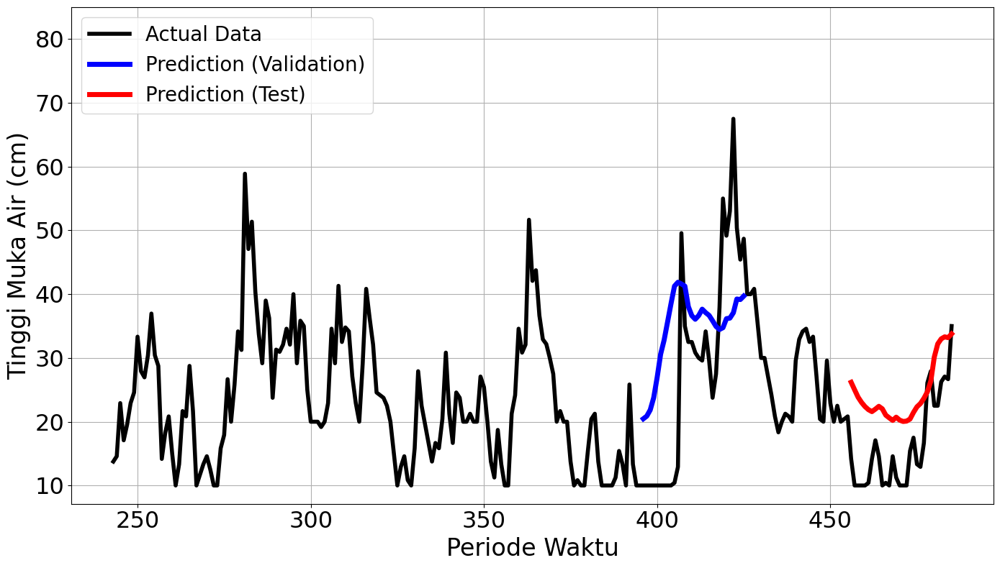

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1820 - val_loss: 0.0545
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.0889 - val_loss: 0.0054
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0283 - val_loss: 0.0285
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0486 - val_loss: 0.0078
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0279 - val_loss: 8.0614e-04
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0225 - val_loss: 1.7927e-04
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - loss: 0.0281 - val_loss: 2.1268e-04
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.0236 - val_loss: 6.2467e-04
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - loss: 0.0368 - val_loss: 0.0084
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - loss: 0.0208 - val_loss: 0.0081
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0231Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

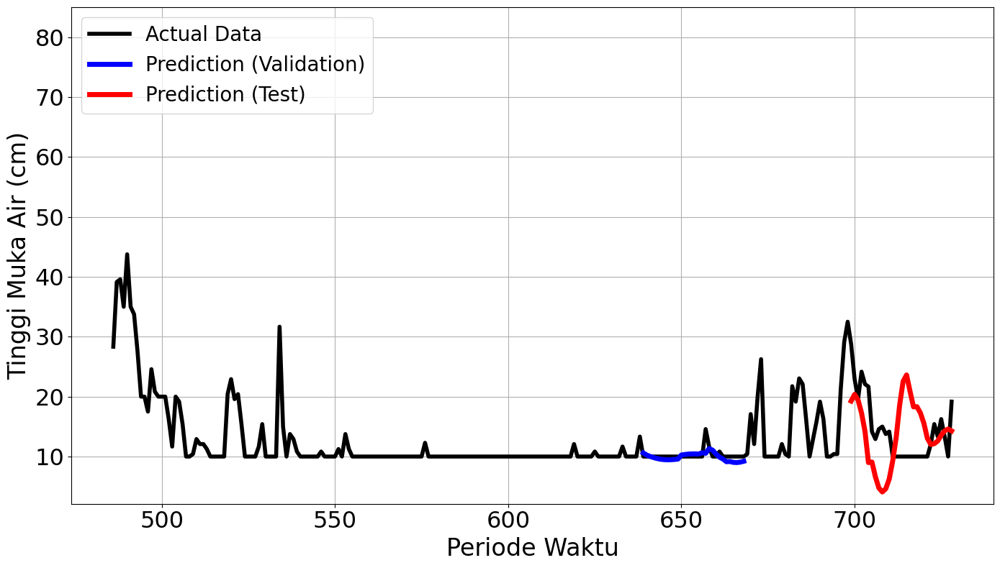

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.1535 - val_loss: 0.2126
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.1650 - val_loss: 0.1040
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step - loss: 0.0837 - val_loss: 0.0086
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.0724 - val_loss: 0.0050
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - loss: 0.0561 - val_loss: 0.0068
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0495 - val_loss: 0.0074
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0435 - val_loss: 0.0075
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - loss: 0.0583 - val_loss: 0.0096
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0441Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0441 - val_loss: 0.0076
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
mape validation = 34.06841200750701 %

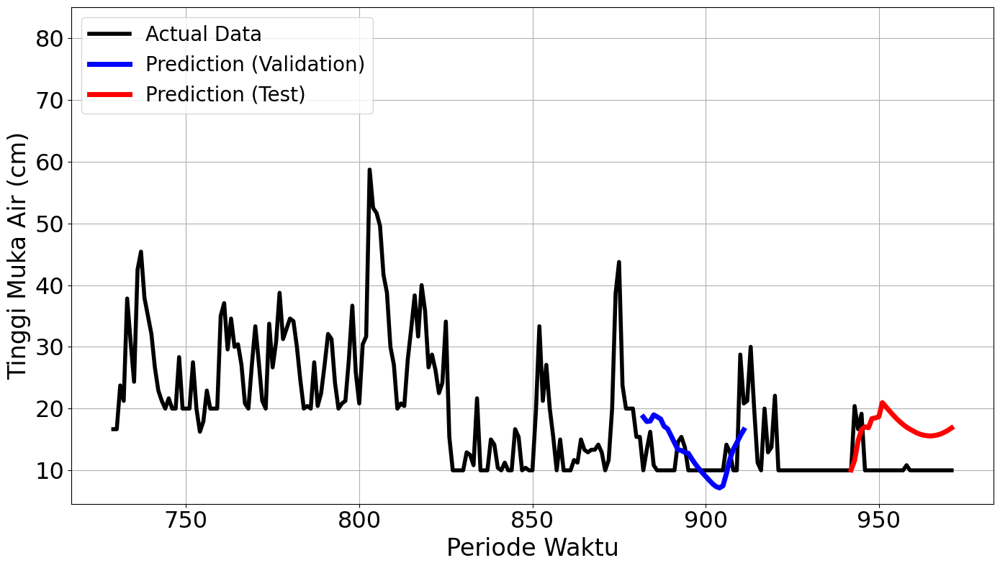

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1596 - val_loss: 0.0594
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.0566 - val_loss: 0.0398
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - loss: 0.0384 - val_loss: 0.0289
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - loss: 0.0337 - val_loss: 0.0283
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 0.0294 - val_loss: 0.0264
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step - loss: 0.0359 - val_loss: 0.0267
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - loss: 0.0271 - val_loss: 0.0355
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step - loss: 0.0213 - val_loss: 0.0377
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - loss: 0.0220 - val_loss: 0.0385
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0292Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - loss: 0.0292 - val_loss: 0.0286
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s

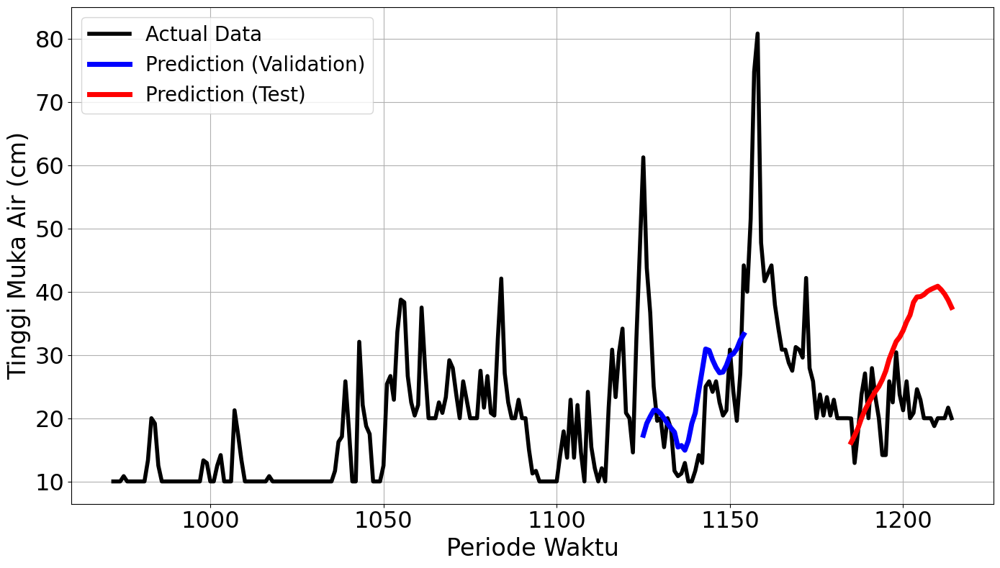

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4607
Final Average MAPE Test: 0.5503


In [10]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Parameter Sliding Window Cross Validation
window_size = 243
n_test = 60
n_train_and_val = window_size - n_test
n_train = n_train_and_val - 60
shift = 243
n_windows1 = 5
n_total = len(data_series)
look_back = 30
time_step = 30

import itertools

config_params = {
    "learning_rate" : [0.001, 0.005],
    "batch_size" : [1, 16, 64, 128],
    "neurons" : [50],
    "init_scheme": ['he_uniform', 'glorot_uniform']
}

average_mape_vals_by_param = []
average_mape_tests_by_param = []

for xs in itertools.product(*list(config_params.values())):
  current_param = dict()
  for i, key in enumerate(config_params.keys()):
    if key == "batch_size":
      bsize = xs[i]
    else:
      current_param[key] = xs[i]

  mape_vals = []
  mape_tests = []

  for i in range(n_windows1):
      start = i * shift
      end = start + window_size
      if end > n_total:
          print(f"Window {i+1} tidak dapat dibuat karena melebihi batas data.")
          break

      window_data = data_series[start:end] #sliding window
      train_and_val = window_data[:n_train_and_val]
      train = train_and_val[:n_train]
      val = train_and_val[n_train:]
      test = window_data[n_train_and_val:]

      try:

          train_generator = TimeseriesGenerator(train, train, length=look_back, batch_size=bsize)

          val_generator = TimeseriesGenerator(val, val, length=look_back, batch_size=bsize)

          test_generator = TimeseriesGenerator(test, test, length=look_back, batch_size=bsize)

          model = create_model(current_param['neurons'], current_param['learning_rate'])

          # model.compile(optimizer='adam', loss='mean_squared_error')

          model.fit(train_generator, epochs=150, validation_data=val_generator, callbacks=[EarlyStoppingAtMinLoss(patience=5)], verbose = 1)

          val_predictions = model.predict(val_generator)
          test_predictions  = model.predict(test_generator)

          val_predictions_descale = scaler.inverse_transform(val_predictions).flatten()
          test_predictions_descale = scaler.inverse_transform(test_predictions).flatten()

          train_actual = scaler.inverse_transform(train).flatten()
          val_actual = scaler.inverse_transform(val).flatten()
          test_actual = scaler.inverse_transform(test).flatten()

          all_actual = np.append(np.append(train_actual, val_actual), test_actual)

          val_true = val[look_back:]
          val_true_descale = scaler.inverse_transform(val_true).flatten()
          mape_val = mean_absolute_percentage_error(val_true_descale, val_predictions_descale)

          test_true = test[look_back:]
          test_true_descale = scaler.inverse_transform(test_true).flatten()
          mape_test = mean_absolute_percentage_error(test_true_descale, test_predictions_descale)

          mape_vals.append(mape_val)
          mape_tests.append(mape_test)

          print(f"mape validation = {mape_val * 100} %")
          print(f"mape test = {mape_test * 100} %")

          # X_actual = np.arange(0, len(train) + len(val) + len(test))
          # X_train = np.arange(0, len(train))
          # X_val = np.arange(len(train) + look_back, len(train) + len(val))
          # X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          start_idx = start
          X_actual = np.arange(start_idx, start_idx + len(train) + len(val) + len(test))
          X_val = np.arange(start_idx + len(train) + look_back, start_idx + len(train) + len(val))
          X_test = np.arange(start_idx + len(train) + len(val) + look_back, start_idx + len(train) + len(val) + len(test))
          # axs[i].plot(X_actual, all_actual, lw=2, color='black', label='actual data')
          # axs[i].plot(X_val, val_predictions_descale, lw=2.5, color='blue', label='prediction validation')
          # axs[i].plot(X_test, test_predictions_descale, lw=2.5, color='red', label='prediction test')
          # axs[i].set_title(f'Window {i+1}')
          # axs[i].legend(loc='upper left')  # legend untuk setiap subplot
          plt.figure(figsize=(14, 8))
          plt.plot(X_actual, all_actual, lw=4, color='black', label='Actual Data')
          plt.plot(X_val, val_predictions_descale, lw=5, color='blue', label='Prediction (Validation)')
          plt.plot(X_test, test_predictions_descale, lw=5, color='red', label='Prediction (Test)')
          # plt.title(f'Window {i+1}', fontsize=25)
          plt.xlabel('Periode Waktu', fontsize=24)
          plt.ylabel('Tinggi Muka Air (cm)', fontsize=24)
          plt.ylim(top=85)
          plt.tick_params(axis='both', labelsize=23)
          # plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
          plt.legend(loc='upper left', fontsize=20)
          plt.grid(True)
          plt.tight_layout()
          plt.show()

      except Exception as e:
          print(f"Error pada Window {i+1}: {e}")
          continue

  # Setelah loop selesai semua
  plt.tight_layout(rect=[0, 0, 1, 0.97])
  plt.show()

  # Rata-rata MAPE akhir
  if mape_vals and mape_tests:
      final_mape_val = np.mean(mape_vals)
      final_mape_test = np.mean(mape_tests)
      print(f"\nFinal Average MAPE Validation: {final_mape_val:.4f}")
      print(f"Final Average MAPE Test: {final_mape_test:.4f}")
      average_mape_vals_by_param.append(final_mape_val)
      average_mape_tests_by_param.append(final_mape_test)

### Hyperparameter Summary (SWCV)

In [11]:
# 1. Buat semua kombinasi hyperparameter
parameter_combinations = list(itertools.product(*config_params.values()))

# 2. Buat DataFrame ringkasan dengan kolom nilai MAPE dan kombinasi param
hyperparameter_summary = pd.DataFrame({
    "mape_vals": average_mape_vals_by_param,
    "mape_tests": average_mape_tests_by_param,
    "param_combo": parameter_combinations  # Masukkan kombinasi ke kolom DataFrame
})

# 3. Urutkan berdasarkan mape_tests (terkecil ke terbesar)
hyperparameter_summary_sorted = hyperparameter_summary.sort_values(by="mape_tests").reset_index(drop=True)

# 4. Ubah param_combo (tuple) menjadi dict agar readable
hyperparameter_summary_sorted["param_dict"] = hyperparameter_summary_sorted["param_combo"].apply(
    lambda combo: {k: combo[i] for i, k in enumerate(config_params.keys())}
)

# 5. Tampilkan seluruh kombinasi dalam urutan performa terbaik
for i, row in hyperparameter_summary_sorted.iterrows():
    print(f"Rank {i+1}:")
    print(f"  MAPE (val):  {row['mape_vals']:.6f}")
    print(f"  MAPE (test): {row['mape_tests']:.6f}")
    print(f"  Params:      {row['param_dict']}")
    print("-" * 40)

Rank 1:
  MAPE (val):  0.199011
  MAPE (test): 0.226090
  Params:      {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
----------------------------------------
Rank 2:
  MAPE (val):  0.199011
  MAPE (test): 0.226090
  Params:      {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------
Rank 3:
  MAPE (val):  0.285815
  MAPE (test): 0.284859
  Params:      {'learning_rate': 0.001, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------
Rank 4:
  MAPE (val):  0.285815
  MAPE (test): 0.284859
  Params:      {'learning_rate': 0.001, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
----------------------------------------
Rank 5:
  MAPE (val):  0.226094
  MAPE (test): 0.296699
  Params:      {'learning_rate': 0.005, 'batch_size': 16, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
--------------------------------------

### Best Parameter (SWCV)

In [12]:
best_param = {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'glorot_uniform'}

In [13]:
def create_model(neurons, learning_rate, init_scheme='glorot_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        kernel_initializer=init_scheme,
        input_shape=(time_step, 1)
    ))
    model.add(Dropout(0.1))
    model.add(Dense(1))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [14]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Data/Data%20TMA%20(Jan%202022%20-%20Mei%202025).csv')
data = data.loc[:, ['Daily_Period', 'TMA_Daily']]
data = data.iloc[972:1215].reset_index(drop=True)

train_data = data.iloc[:123]
val_data = data.iloc[123:183]
test_data = data.iloc[183:]

# Mengambil kolom 'TMA_Daily' sebagai data yang akan diprediksi
time_series_data = data['TMA_Daily'].values.reshape(-1, 1)

# Normalisasi data ke rentang 0-1
scaler = MinMaxScaler()
time_series_data = scaler.fit_transform(time_series_data)

# Menentukan ukuran dataset
train_size = 123
val_size = 60
test_size = len(time_series_data) - train_size - val_size

# Membagi data menjadi train, val, test
train_data = time_series_data[:train_size]
val_data = time_series_data[train_size:train_size+val_size]
test_data = time_series_data[train_size+val_size:]

# Fungsi untuk membuat dataset dengan sekuens deret waktu
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i : i + seq_length])
    return np.array(sequences)

# Panjang sekuens deret waktu
seq_length = 30

# Membuat dataset sekuens
X_train = create_sequences(train_data, seq_length)
X_val = create_sequences(val_data, seq_length)
X_test = create_sequences(test_data, seq_length)

# Memisahkan fitur dan target
y_train = X_train[:, -1]
X_train = X_train[:, :-1]

y_val = X_val[:, -1]
X_val = X_val[:, :-1]

y_test = X_test[:, -1]
X_test = X_test[:, :-1]

# Reshape untuk input LSTM (samples, time steps, features)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

model = create_model(best_param['neurons'],
                     best_param['learning_rate'],
                     best_param.get('init_scheme', 'glorot_uniform')
)
history = model.fit(
    X_train, y_train,
    epochs=40,
    batch_size=1,
    validation_data=(X_val, y_val),
    verbose=10)

Epoch 1/40


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/40
Epoch 3/40
Epoch 4/40
Epoch 5/40
Epoch 6/40
Epoch 7/40
Epoch 8/40
Epoch 9/40
Epoch 10/40
Epoch 11/40
Epoch 12/40
Epoch 13/40
Epoch 14/40
Epoch 15/40
Epoch 16/40
Epoch 17/40
Epoch 18/40
Epoch 19/40
Epoch 20/40
Epoch 21/40
Epoch 22/40
Epoch 23/40
Epoch 24/40
Epoch 25/40
Epoch 26/40
Epoch 27/40
Epoch 28/40
Epoch 29/40
Epoch 30/40
Epoch 31/40
Epoch 32/40
Epoch 33/40
Epoch 34/40
Epoch 35/40
Epoch 36/40
Epoch 37/40
Epoch 38/40
Epoch 39/40
Epoch 40/40


### Plot Model Loss

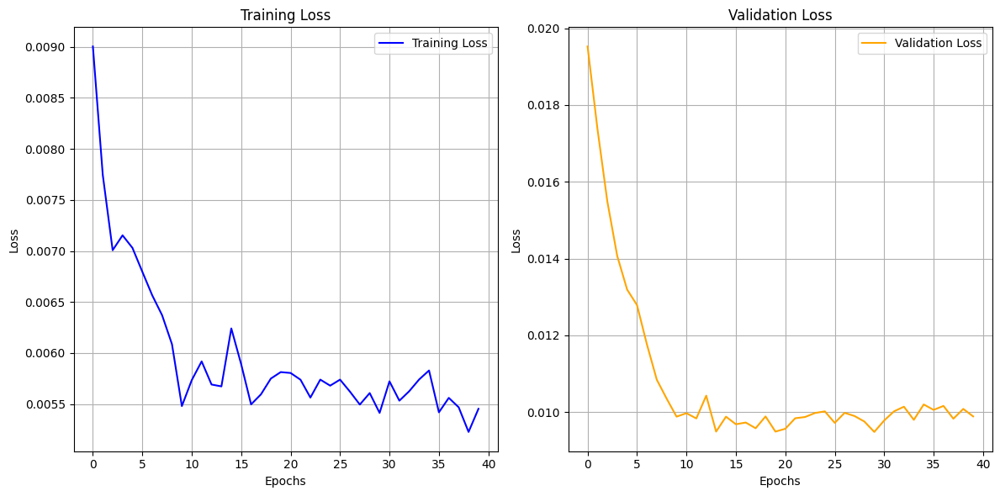

In [15]:
import matplotlib.pyplot as plt

# Membuat subplot 1 baris 2 kolom
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Subplot kiri: Training Loss
axs[0].plot(history.history['loss'], label='Training Loss', color='blue')
axs[0].set_title('Training Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].grid(True)
axs[0].legend()

# Subplot kanan: Validation Loss
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='orange')
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].grid(True)
axs[1].legend()

# Tata letak rapat
plt.tight_layout()
plt.show()

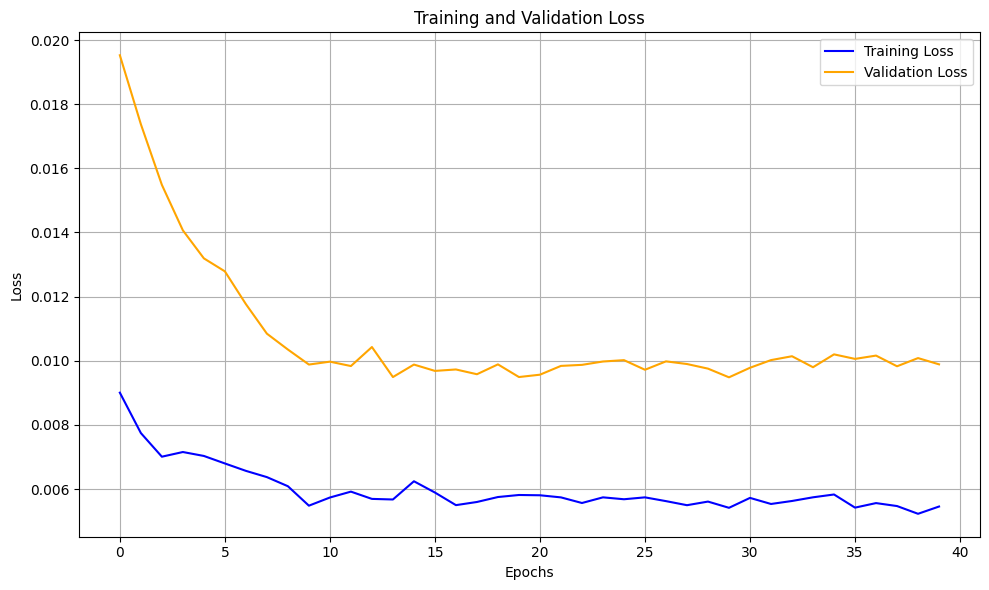

In [16]:
import matplotlib.pyplot as plt

# Membuat plot gabungan training dan validation loss
plt.figure(figsize=(10, 6))

plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')

plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

### MAPE Train

In [17]:
def inverse_transform(scaler, input):
  return input * (scaler.data_max_[0] - scaler.data_min_[0]) + scaler.data_min_[0]

# inverse_transform(scaler, predicted)

In [18]:
train_predict = model.predict(X_train).flatten()
train_predict_denorm = inverse_transform(scaler, train_predict)
y_train_denorm = inverse_transform(scaler, y_train)
mape_train = mean_absolute_percentage_error(y_train_denorm, train_predict_denorm)
mape_train

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step


0.23040839579334765

### Plot Train Actual vs Predicted

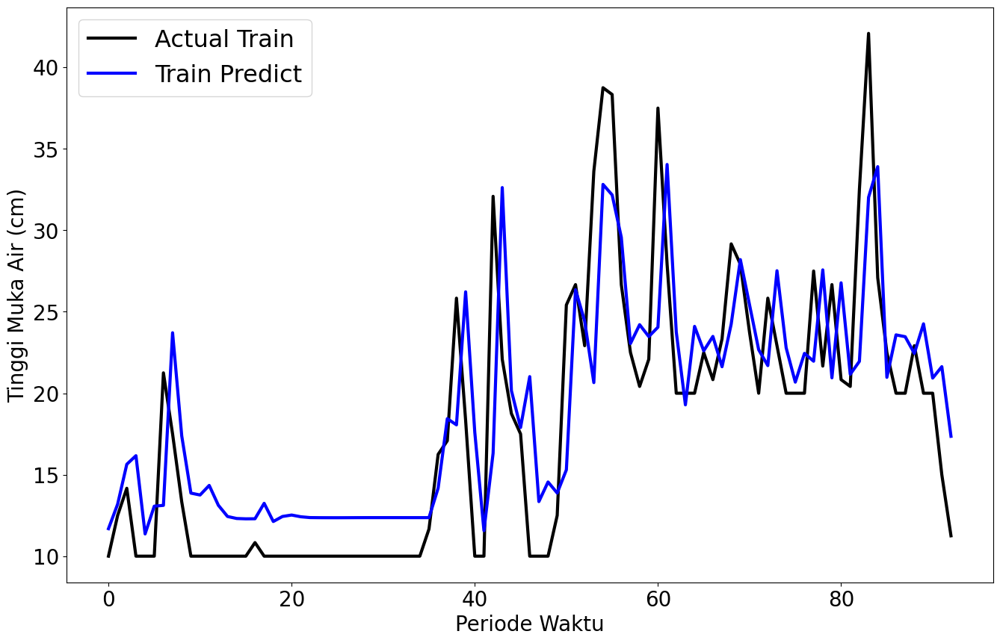

In [19]:
# Plot perbandingan actual train dan train predict

plt.figure(figsize=(16, 10))

plt.plot(y_train_denorm, lw=3, label='Actual Train', color = 'black')
plt.plot(train_predict_denorm, lw=3, label='Train Predict', color = 'blue')
# plt.title('Perbandingan Actual Train dan Train Predict')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Periode Waktu', fontsize=20)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=20)
plt.legend(loc = 'upper left', fontsize = 23)
plt.show()